In [1]:
import pandas as pd
import numpy as np
import json
from collections import defaultdict

import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

from fa2 import ForceAtlas2
import community

import os
import sys
import copy

import re
import nltk
from nltk.corpus import stopwords
import progressbar

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import community

from PIL import Image
import random

# Function definitions

In [2]:
# Function to calculate TF-IDF
def TFIDF(dataframes):
    dataframes_tfidf = []
    all_words = []
    
    #Caclulate TF
    for i in range(len(dataframes)):
        df = dataframes[i]
        df_tfidf = df.groupby("word").size()
        df_words = df_tfidf.index
        df_counts = df_tfidf.values
        
        df_tfidf = pd.DataFrame(data=dict(word=df_words, TF=df_counts))
        df_tfidf.sort_values(by="TF", ascending=False)
        df_tfidf.reset_index(inplace=True)
        dataframes_tfidf.append(df_tfidf)
        
        all_words.extend(df_words)
    
    df_all = pd.DataFrame(data=dict(word=all_words))
    df_all = df_all.groupby("word").size()
    df_all_words = df_all.index
    df_all_counts = df_all.values
    df_all = pd.DataFrame(data=dict(word=df_all_words,
                                    count=df_all_counts))
    #Calculate IDF
    N = len(dataframes)
    for i in range(len(dataframes_tfidf)):
        df = dataframes_tfidf[i]
        df_merged = pd.merge(df, df_all, on="word")
        df_merged["IDF"] = N/(1+np.log(df_merged["count"]))
        df_merged["TFIDF"] = df_merged["TF"] * df_merged["IDF"]
        df_merged.sort_values(by="TFIDF", ascending=False)
        dataframes_tfidf[i] = df_merged
    
    return dataframes_tfidf



In [3]:
# Download the list of word sentiments
word_sentiments = pd.read_csv("sentiment.csv")[["word", "happiness_rank", "happiness_average", "happiness_standard_deviation"]]

# A function that calculates the sentiment of a list of tokens
def evaluate_sentiment(tokens):
    # Convert tokens list to dataframe
    df = pd.DataFrame(data=dict(word=tokens))
    # Count how many times each word is mentioned
    df2 = df.groupby("word").size()
    words = df2.index.values
    # Convert counts to frequency
    freq = df2.values / float(len(tokens))
    
    # DataFrame with word frequencies
    df_final = pd.DataFrame(data=dict(word=words, freqs=freq))
    
    # Calculate the sentiment using word frequency and word happiness
    df_final = df_final.merge(word_sentiments, on="word")
    df_final["havg"] = df_final["happiness_average"]*df_final["freqs"]
    
    return sum(df_final["havg"])

# Network creation

In [4]:
with open("Data/starwars_vader_split.json") as f:
    starwars_json = json.load(f)

In [16]:
with open("Data/starwars_with_sentiment.json") as f:
    starwars_json = json.load(f)
    
movies = ["Star Wars: Episode I The Phantom Menice", "Star Wars: Episode II Attack of the Clones",
        "Star Wars: The Clone Wars (film)", "Star Wars: Episode III Revenge of the Sith",
        "Solo: A Star Wars Story", "Rogue One: A Star Wars Story", "Star Wars: Episode IV A New Hope",
        "Star Wars: Episode V The Empire Strikes Back", "Star Wars: Episode VI Return of the Jedi",
        "Star Wars: Episode VII The Force Awakens", "Star Wars: Episode VIII The Last Jedi"]

animated_series_names = ["Star Wars: The Clone Wars (series)", "Star Wars Rebels"]

original_trilogy = movies[6:9]

use = original_trilogy


use = [movies[6]]#("series", animated_series_names[0])]


In [72]:
movies = ["Star Wars: Episode I The Phantom Menice", "Star Wars: Episode II Attack of the Clones",
        "Star Wars: The Clone Wars (film)", "Star Wars: Episode III Revenge of the Sith",
        "Solo: A Star Wars Story", "Rogue One: A Star Wars Story", "Star Wars: Episode IV A New Hope",
        "Star Wars: Episode V The Empire Strikes Back", "Star Wars: Episode VI Return of the Jedi",
        "Star Wars: Episode VII The Force Awakens", "Star Wars: Episode VIII The Last Jedi"]

animated_series_names = ["Star Wars: The Clone Wars (series)", "Star Wars Rebels"]

digraphs = defaultdict(dict)
all_media = movies
all_media.extend(animated_series_names)
print all_media
# Create graphs for each film
exclude_from_nodes = set(["canon", "hologram", "ABC Television Network"])
nodes = []
for m in all_media:
    
    DG = nx.DiGraph()
    nodes = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
    for n in nodes:
    #     if n == "Darth Vader":
    #         print starwars_json["data"]["characters"][n]
        movie = [x for x in starwars_json["data"]["movies"].keys() if n in starwars_json["data"]["movies"][x]["characters"]]
        series = defaultdict(list)
        for s in starwars_json["data"]["series"].keys():
            for e in starwars_json["data"]["series"][s]:
                if n in starwars_json["data"]["series"][s][e]["characters"]:
                    series[s].append(e)
                    
        affiliations = starwars_json["data"]["characters"][n]["affiliations"]
        if len(affiliations) < 1:
            affiliations = ["Unknown"]
        attribute = {"affiliations": affiliations}
        
        if (m in movie) or (m in series):
            DG.add_node(n, data=attribute)

    # Create links between nodes
    for n in DG.nodes():
        links = list(set(starwars_json["data"]["characters"][n]["connections"]).difference(
            set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)).intersection(DG.nodes()))
        
        if n == "Darth Vader":
            new_links = []
            for l in links:
                if "Darth Vader" in starwars_json["data"]["characters"][l]["connections"] or "Anakin Skywalker" not in starwars_json["data"]["characters"][l]["connections"]:
                    new_links.append(l)
            links = new_links
            
        if n == "Anakin Skywalker":
            new_links = []
            for l in links:
                if "Darth Vader" not in starwars_json["data"]["characters"][l]["connections"] or "Anakin Skywalker" in starwars_json["data"]["characters"][l]["connections"]:
                    new_links.append(l)
            links = new_links
        
        if len(links) > 0:
            for l in links:
                DG.add_edge(n, l)
    digraphs[m]["graph"] = DG
    
    print m
    print "Nodes:", str(len(DG.nodes()))
    print "Edges:", str(len(DG.edges()))
    print "AVG degree:", np.mean(zip(*DG.degree())[1])
    print
    print

    
#Create graph of the entire joint universe
DG = nx.DiGraph()
nodes = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
for n in nodes:
#     if n == "Darth Vader":
#         print starwars_json["data"]["characters"][n]
    movie = [x for x in starwars_json["data"]["movies"].keys() if n in starwars_json["data"]["movies"][x]["characters"]]
    series = defaultdict(list)
    for s in starwars_json["data"]["series"].keys():
        for e in starwars_json["data"]["series"][s]:
            if n in starwars_json["data"]["series"][s][e]["characters"]:
                series[s].append(e)
    affiliations = starwars_json["data"]["characters"][n]["affiliations"]
    if len(affiliations) < 1:
        affiliations = ["Unknown"]
    attribute = {"affiliations": affiliations}
    DG.add_node(n, data=attribute)

# Create links between nodes
for n in DG.nodes():
    links = list(set(starwars_json["data"]["characters"][n]["connections"]).difference(
        set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
    
    if n == "Darth Vader":
        new_links = []
        for l in links:
            if "Darth Vader" in starwars_json["data"]["characters"][l]["connections"] or "Anakin Skywalker" not in starwars_json["data"]["characters"][l]["connections"]:
                new_links.append(l)
        links = new_links

    if n == "Anakin Skywalker":
        new_links = []
        for l in links:
            if "Darth Vader" not in starwars_json["data"]["characters"][l]["connections"] or "Anakin Skywalker" in starwars_json["data"]["characters"][l]["connections"]:
                new_links.append(l)
        links = new_links
    
    if len(links) > 0:
        for l in links:
            DG.add_edge(n, l)
digraphs["all"]["graph"] = DG

print "Everything"
print "Nodes:", str(len(DG.nodes()))
print "Edges:", str(len(DG.edges()))
print "AVG degree:", np.mean(zip(*DG.degree())[1])

['Star Wars: Episode I The Phantom Menice', 'Star Wars: Episode II Attack of the Clones', 'Star Wars: The Clone Wars (film)', 'Star Wars: Episode III Revenge of the Sith', 'Solo: A Star Wars Story', 'Rogue One: A Star Wars Story', 'Star Wars: Episode IV A New Hope', 'Star Wars: Episode V The Empire Strikes Back', 'Star Wars: Episode VI Return of the Jedi', 'Star Wars: Episode VII The Force Awakens', 'Star Wars: Episode VIII The Last Jedi', 'Star Wars: The Clone Wars (series)', 'Star Wars Rebels']
Star Wars: Episode I The Phantom Menice
Nodes: 124
Edges: 726
AVG degree: 11.709677419354838


Star Wars: Episode II Attack of the Clones
Nodes: 135
Edges: 930
AVG degree: 13.777777777777779


Star Wars: The Clone Wars (film)
Nodes: 47
Edges: 461
AVG degree: 19.617021276595743


Star Wars: Episode III Revenge of the Sith
Nodes: 143
Edges: 1035
AVG degree: 14.475524475524475


Solo: A Star Wars Story
Nodes: 149
Edges: 367
AVG degree: 4.926174496644295


Rogue One: A Star Wars Story
Nodes: 179
E

In [19]:
for dig in digraphs.keys():
    print
    print dig
    DG = digraphs[dig]["graph"]
    # Setup for the force atlas algorithm.
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=False,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=1.0,

                              # Performance
                              jitterTolerance=0.01,  # Tolerance
                              barnesHutOptimize=True,
                              barnesHutTheta=0.12,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=0.02,
                              strongGravityMode=False,
                              gravity=1.0,

                              # Log
                              verbose=True)

    # Create an undirected version of the graph
    G = DG.to_undirected()

    # Calculate node positions with the force atlas algorithm using the undirected graph
    positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=20000)
    pos_for_json = {}
    for x in positions:
        pos_for_json[x] = list(positions[x])
    digraphs[dig]["node_pos"] = pos_for_json
    
dgraphs = copy.deepcopy(digraphs)
for dig in dgraphs.keys():
    dgraphs[dig]["graph"] = nx.readwrite.json_graph.node_link_data(DG)

with open(os.path.join("Data", "movie_networks.json"), 'w') as f:
    json.dump(dgraphs, f)


Star Wars: Episode II Attack of the Clones


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:02<00:00, 308.58it/s]


('BarnesHut Approximation', ' took ', '4.62', ' seconds')
('Repulsion forces', ' took ', '52.98', ' seconds')
('Gravitational forces', ' took ', '0.23', ' seconds')
('Attraction forces', ' took ', '0.27', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.90', ' seconds')

Star Wars: Episode VI Return of the Jedi


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [00:53<00:00, 372.02it/s]


('BarnesHut Approximation', ' took ', '4.39', ' seconds')
('Repulsion forces', ' took ', '45.03', ' seconds')
('Gravitational forces', ' took ', '0.22', ' seconds')
('Attraction forces', ' took ', '0.23', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.84', ' seconds')

Star Wars: The Clone Wars (series)


100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [22:52<00:00, 14.46it/s]


('BarnesHut Approximation', ' took ', '38.66', ' seconds')
('Repulsion forces', ' took ', '1277.92', ' seconds')
('Gravitational forces', ' took ', '1.40', ' seconds')
('Attraction forces', ' took ', '1.61', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '4.53', ' seconds')

Star Wars: The Clone Wars (film)


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:08<00:00, 2295.42it/s]


('BarnesHut Approximation', ' took ', '1.26', ' seconds')
('Repulsion forces', ' took ', '6.37', ' seconds')
('Gravitational forces', ' took ', '0.09', ' seconds')
('Attraction forces', ' took ', '0.11', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.30', ' seconds')

Solo: A Star Wars Story


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:15<00:00, 266.40it/s]


('BarnesHut Approximation', ' took ', '5.14', ' seconds')
('Repulsion forces', ' took ', '64.39', ' seconds')
('Gravitational forces', ' took ', '0.30', ' seconds')
('Attraction forces', ' took ', '0.17', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.04', ' seconds')

Star Wars: Episode IV A New Hope


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:17<00:00, 259.72it/s]


('BarnesHut Approximation', ' took ', '4.88', ' seconds')
('Repulsion forces', ' took ', '66.67', ' seconds')
('Gravitational forces', ' took ', '0.23', ' seconds')
('Attraction forces', ' took ', '0.24', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.01', ' seconds')

Rogue One: A Star Wars Story


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:45<00:00, 189.20it/s]


('BarnesHut Approximation', ' took ', '7.52', ' seconds')
('Repulsion forces', ' took ', '91.07', ' seconds')
('Gravitational forces', ' took ', '0.32', ' seconds')
('Attraction forces', ' took ', '0.21', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.18', ' seconds')

Star Wars: Episode VIII The Last Jedi


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:39<00:00, 202.01it/s]


('BarnesHut Approximation', ' took ', '7.74', ' seconds')
('Repulsion forces', ' took ', '84.26', ' seconds')
('Gravitational forces', ' took ', '0.29', ' seconds')
('Attraction forces', ' took ', '0.23', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.20', ' seconds')

Star Wars: Episode V The Empire Strikes Back


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:16<00:00, 1187.01it/s]


('BarnesHut Approximation', ' took ', '2.05', ' seconds')
('Repulsion forces', ' took ', '13.10', ' seconds')
('Gravitational forces', ' took ', '0.10', ' seconds')
('Attraction forces', ' took ', '0.11', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.44', ' seconds')

all


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [2:26:03<00:00,  2.36it/s]


('BarnesHut Approximation', ' took ', '197.47', ' seconds')
('Repulsion forces', ' took ', '8451.28', ' seconds')
('Gravitational forces', ' took ', '3.69', ' seconds')
('Attraction forces', ' took ', '3.25', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '11.98', ' seconds')

Star Wars: Episode III Revenge of the Sith


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:07<00:00, 296.80it/s]


('BarnesHut Approximation', ' took ', '4.54', ' seconds')
('Repulsion forces', ' took ', '57.87', ' seconds')
('Gravitational forces', ' took ', '0.25', ' seconds')
('Attraction forces', ' took ', '0.24', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.93', ' seconds')

Star Wars Rebels


100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [03:35<00:00, 92.60it/s]


('BarnesHut Approximation', ' took ', '10.00', ' seconds')
('Repulsion forces', ' took ', '193.12', ' seconds')
('Gravitational forces', ' took ', '0.44', ' seconds')
('Attraction forces', ' took ', '0.68', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.80', ' seconds')

Star Wars: Episode I The Phantom Menice


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [00:50<00:00, 394.91it/s]


('BarnesHut Approximation', ' took ', '3.85', ' seconds')
('Repulsion forces', ' took ', '42.87', ' seconds')
('Gravitational forces', ' took ', '0.20', ' seconds')
('Attraction forces', ' took ', '0.21', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.82', ' seconds')

Star Wars: Episode VII The Force Awakens


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:37<00:00, 205.93it/s]


('BarnesHut Approximation', ' took ', '7.12', ' seconds')
('Repulsion forces', ' took ', '83.60', ' seconds')
('Gravitational forces', ' took ', '0.25', ' seconds')
('Attraction forces', ' took ', '0.24', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.10', ' seconds')


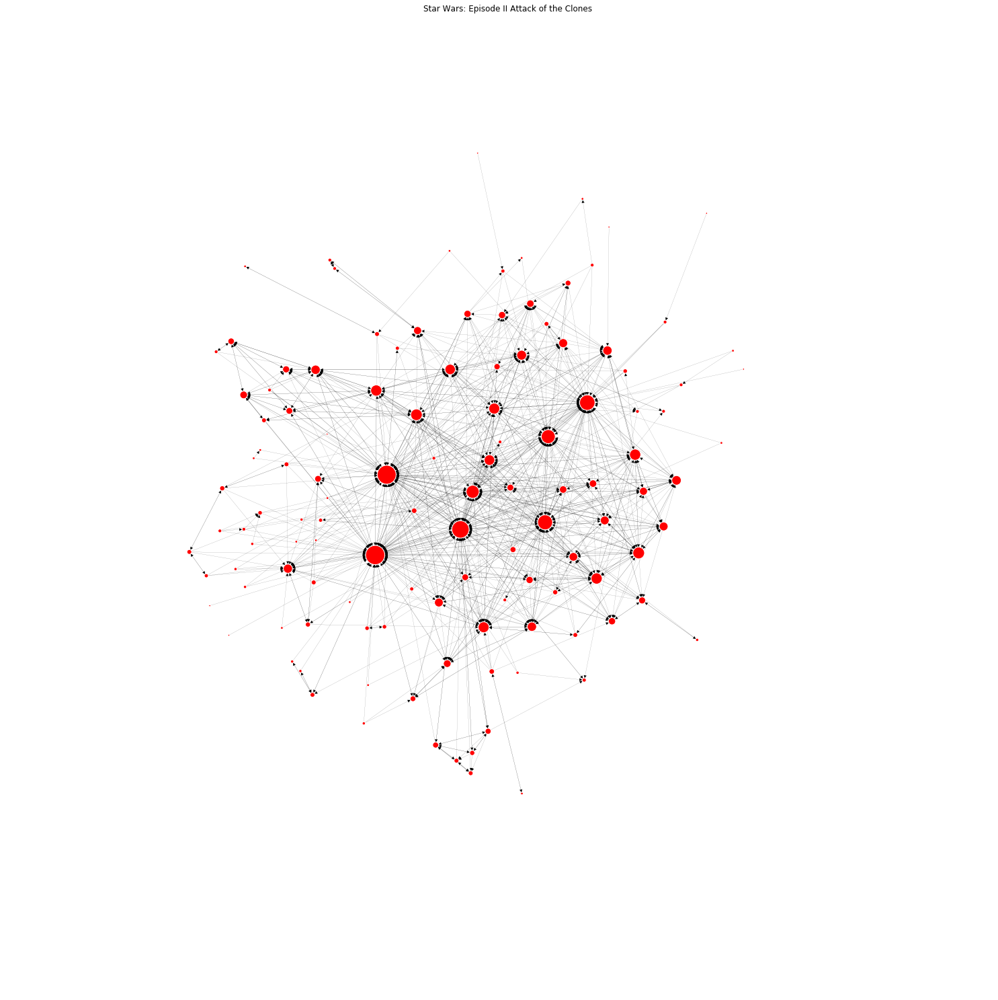

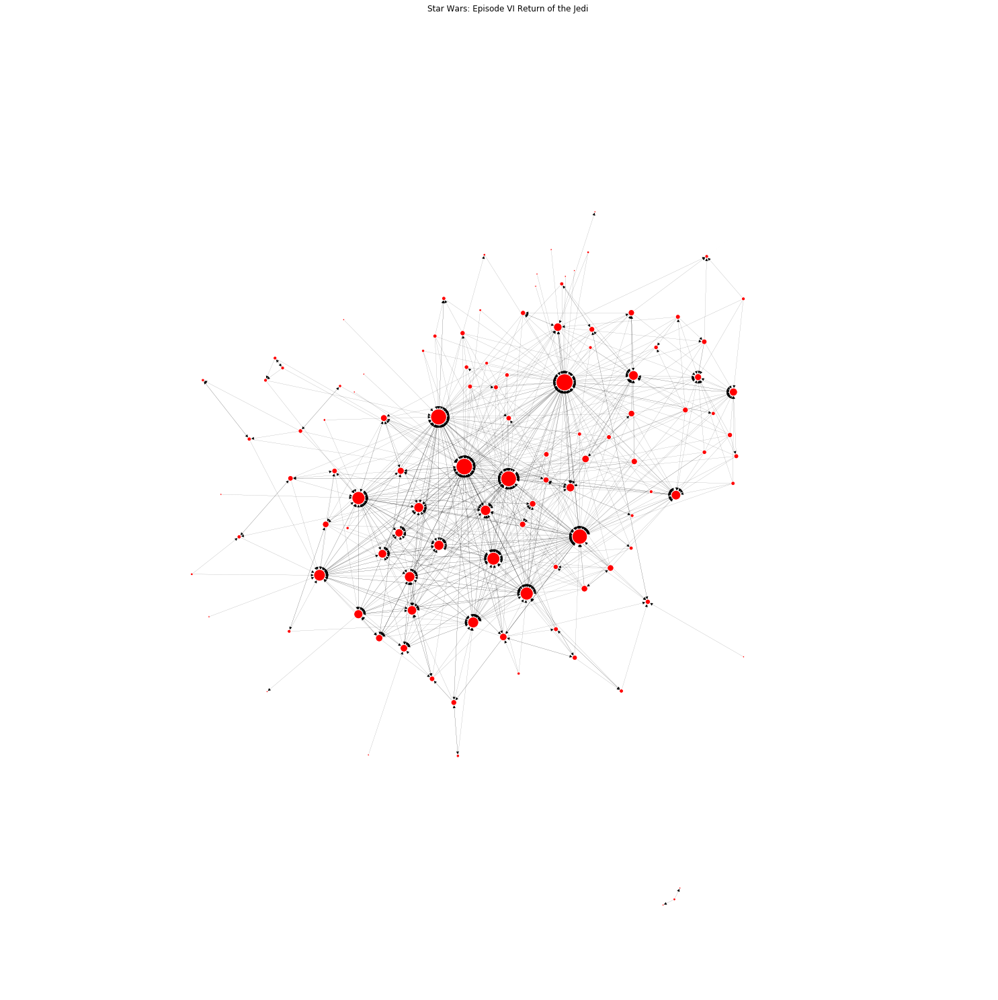

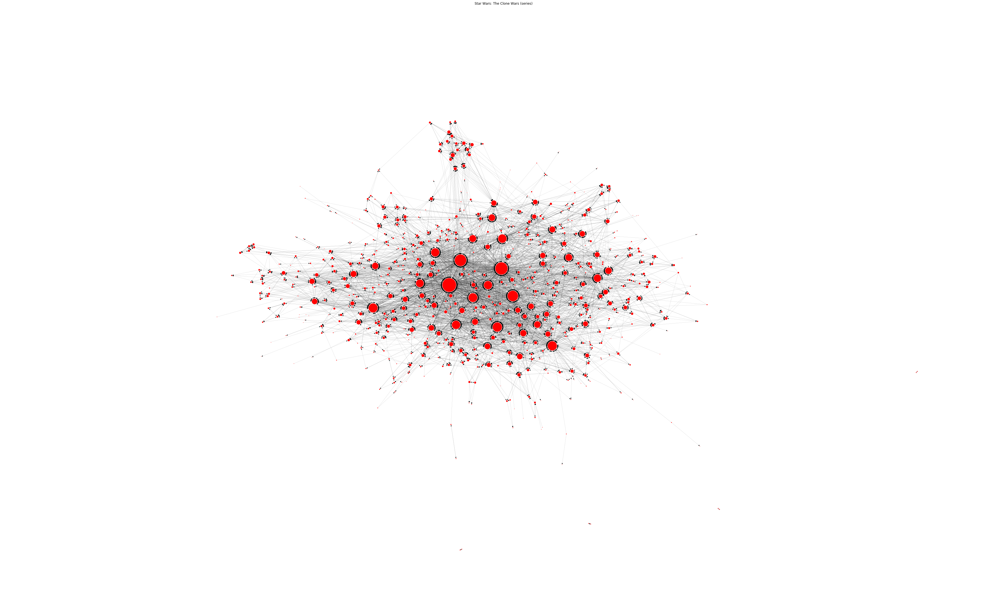

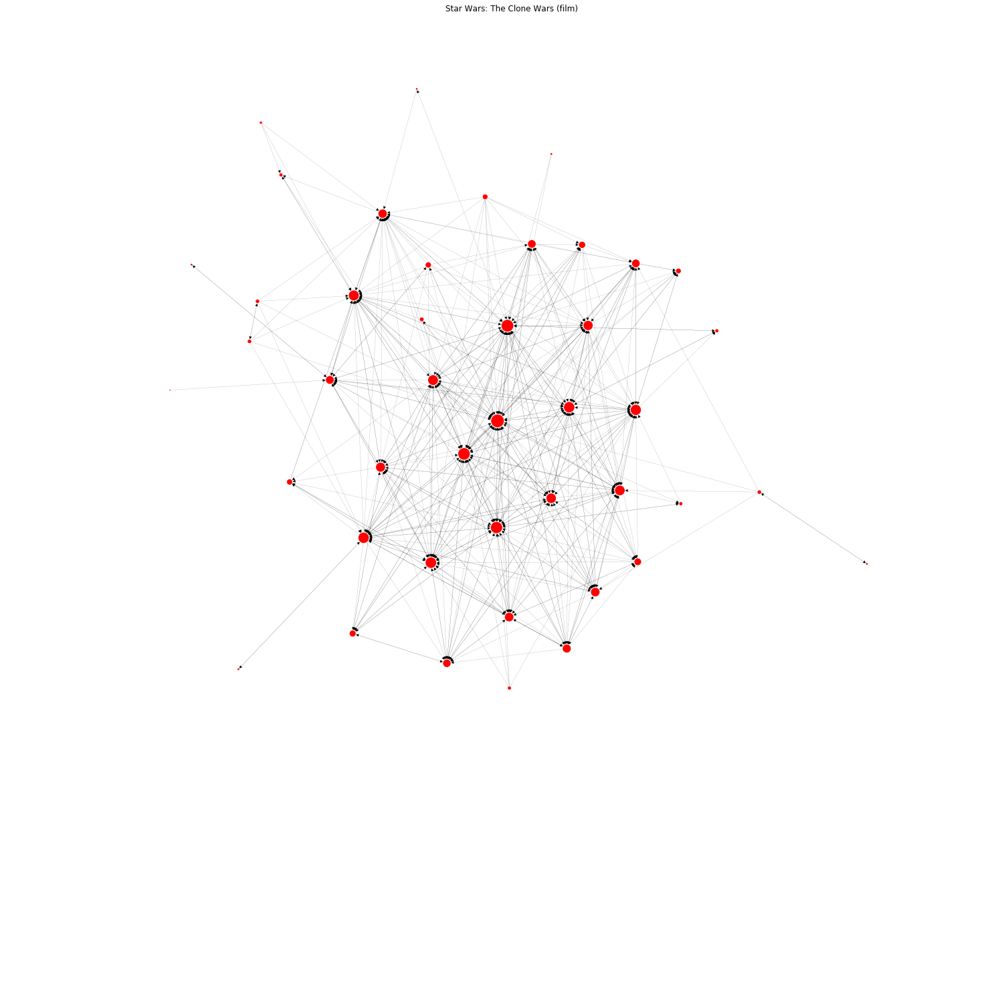

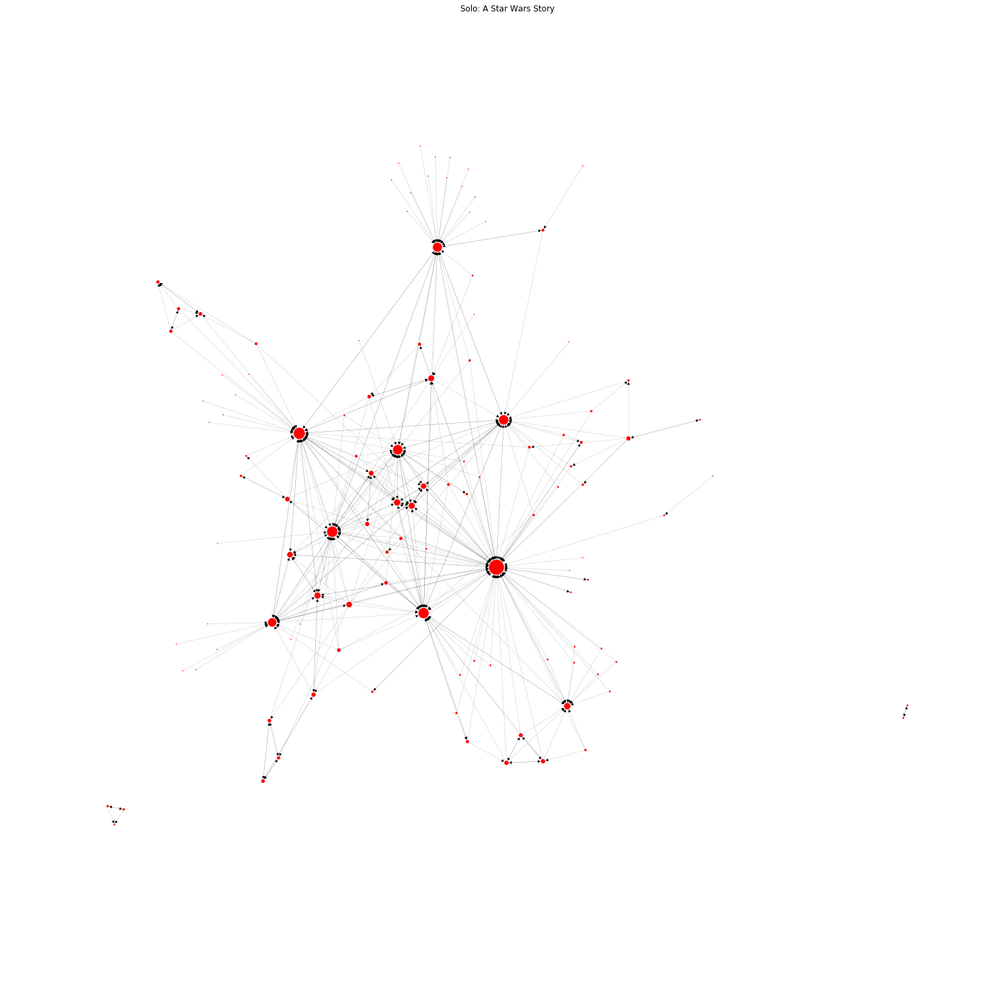

...

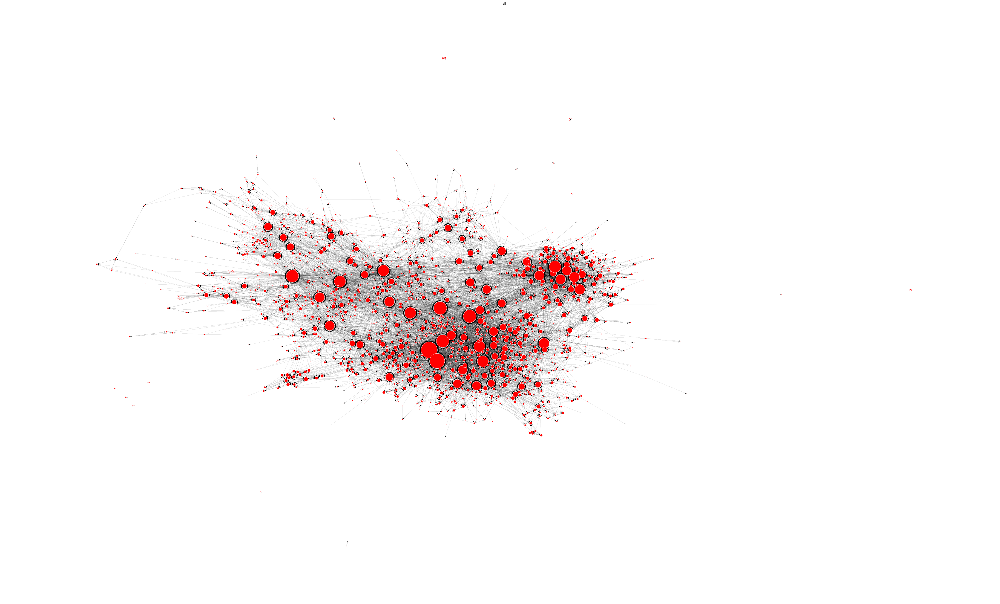

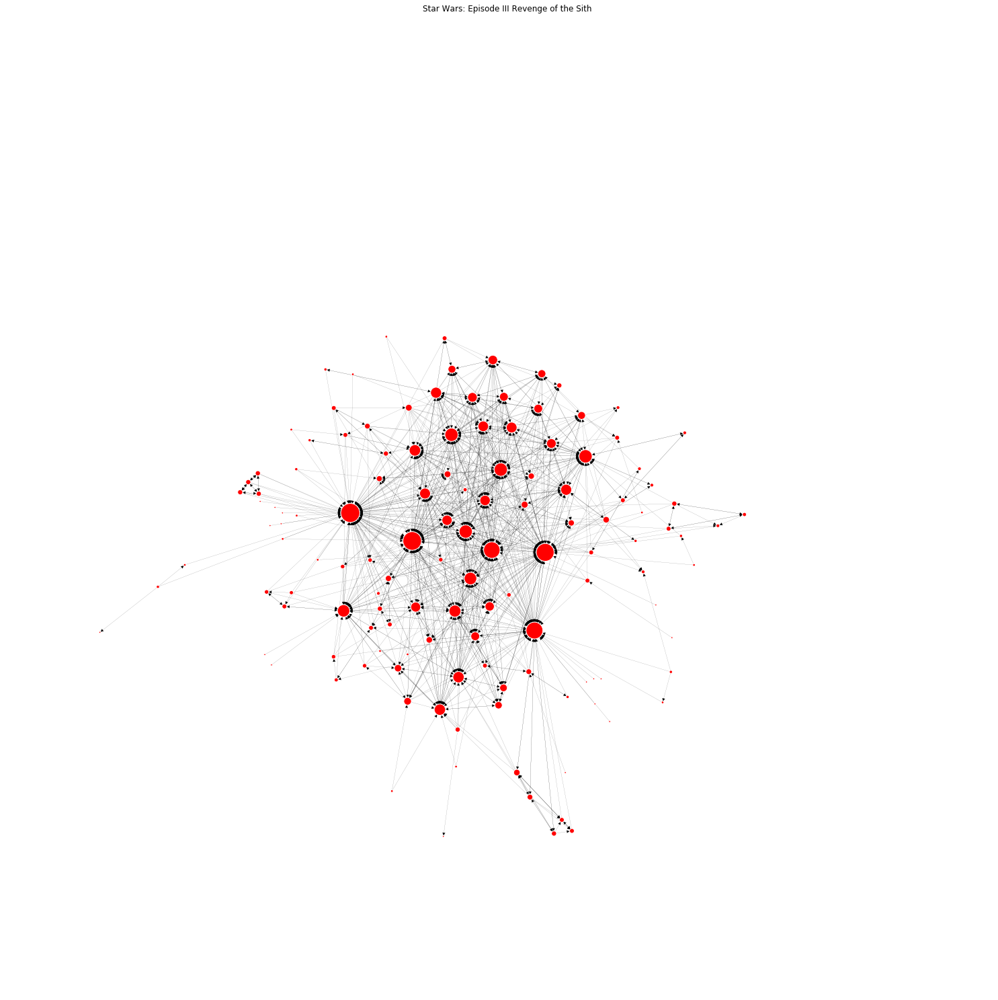

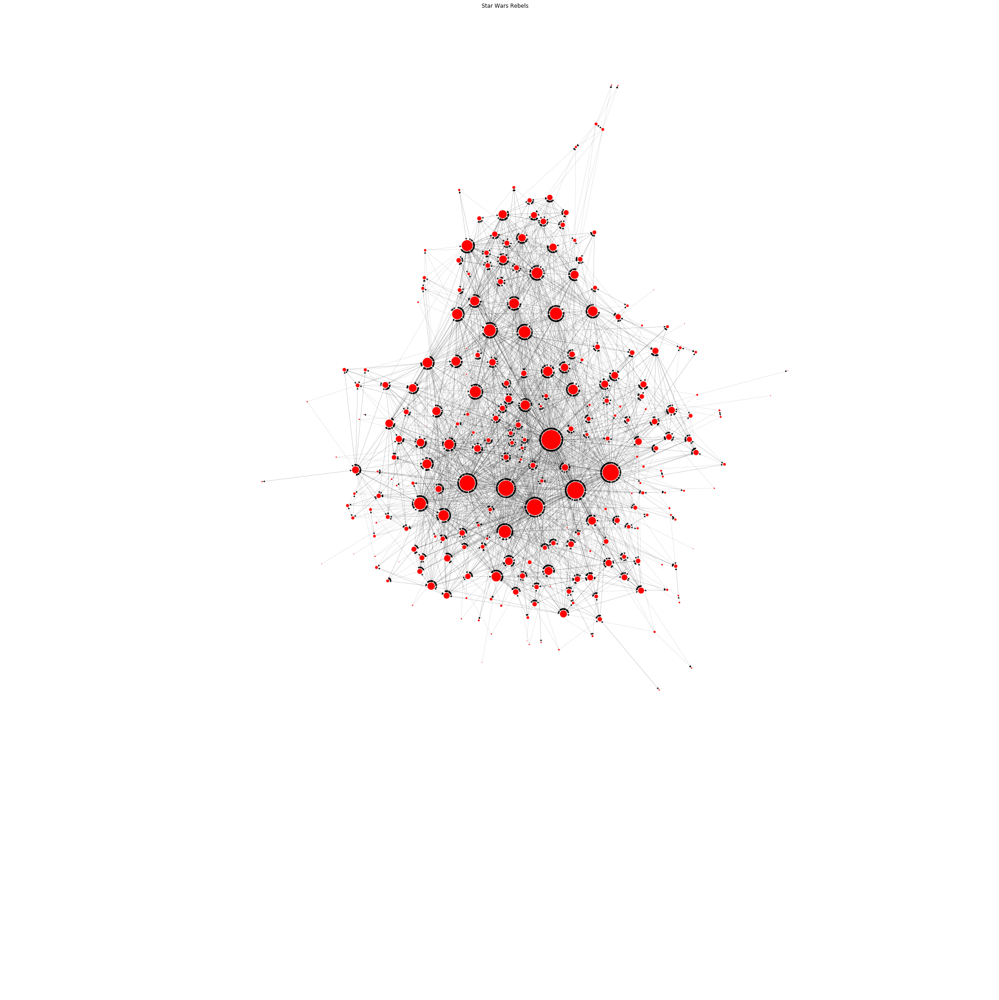

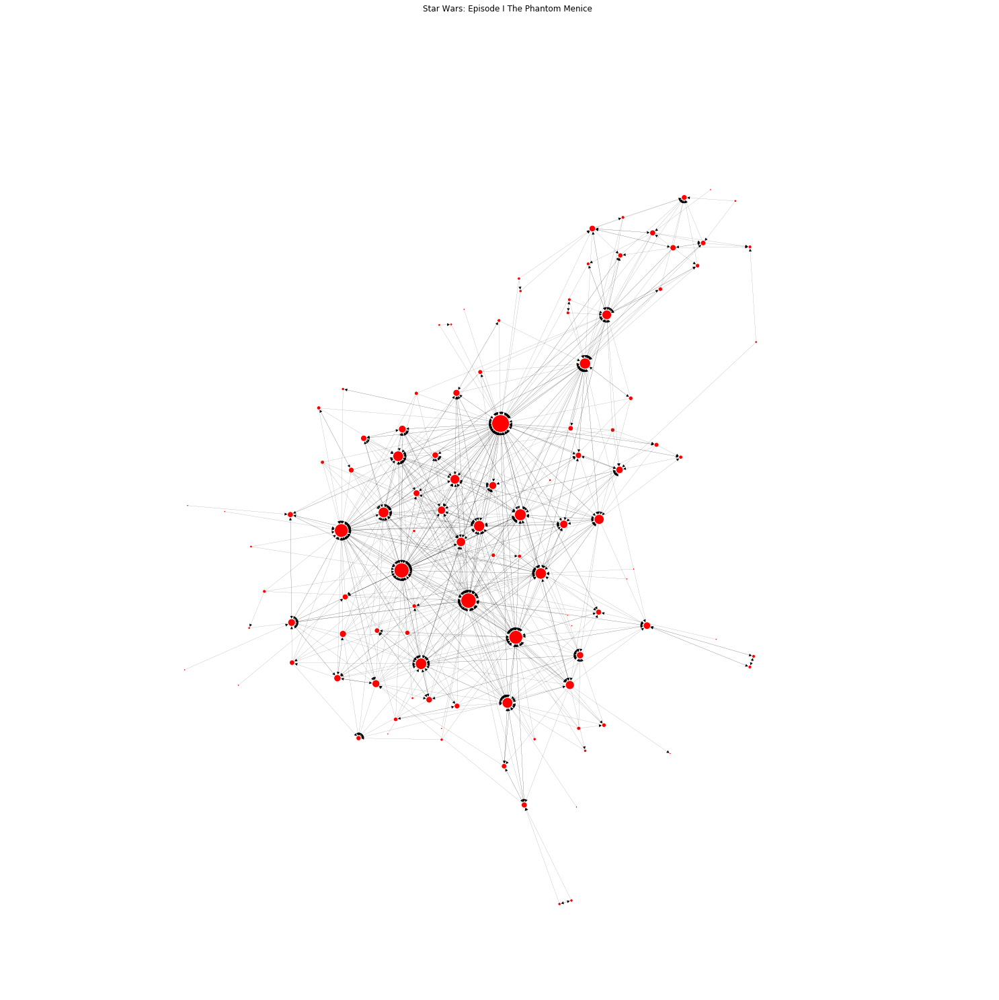

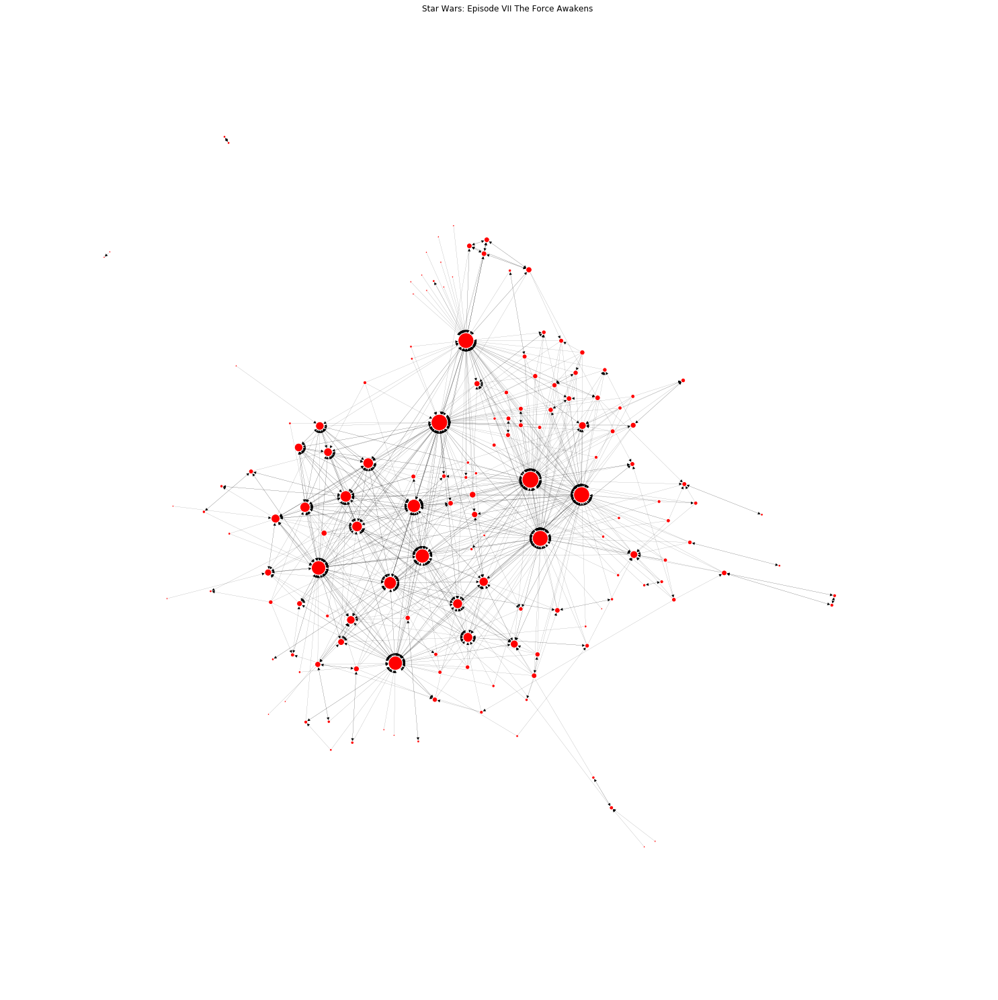

In [20]:
for dig in digraphs.keys():
    DG = digraphs[dig]["graph"]
    nodes = DG.nodes(data=True)
    nodes_2, degrees = zip(*DG.degree())

    # node size proportional to the degree
    node_sizes_deg = [7*x for x in degrees]

    # # Color according to the party
    # node_colors = ['r' if x[1]['party'] == "Republican" else "b" for x in nodes]
    # nx.draw(DG, positions, node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)
    if dig in ("all","Star Wars: The Clone Wars (series)"):
        plt.figure(figsize=(50,30))
    elif dig == "Star Wars Rebels":
        plt.figure(figsize=(30,30))
    else:
        plt.figure(figsize=(20,20))
    nx.draw(DG, digraphs[dig]["node_pos"], node_color='red', node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)
#     plt.title(dig)
    print dig
    directory = os.path.join("Data", dig.replace(" ", "_").replace(":",""))
    if not os.path.exists(directory):
        os.makedirs(directory)
    plt.savefig(os.path.join(directory, "network.png"))





Star Wars: Episode II Attack of the Clones
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>116</td>\n    </tr>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>112</td>\n    </tr>\n    <tr>\n      <td>Padm\xe9 Amidala</td>\n      <td>94</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>74</td>\n    </tr>\n    <tr>\n      <td>Mace Windu</td>\n      <td>70</td>\n    </tr>\n    <tr>\n      <td>Dooku</td>\n      <td>61</td>\n    </tr>\n    <tr>\n      <td>Yoda</td>\n      <td>53</td>\n    </tr>\n    <tr>\n      <td>Kit Fisto</td>\n      <td>43</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>Plo Koon</td>\n      <td>39</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Obi-Wan Kenobi,78
Anakin Skywalker,69
Padmé Amidala,65
Darth Sidious,51
Mace Windu,42
Dooku,42
Yoda,36
Jango Fett,26
Qui-Gon Jinn,25
Zam Wesell,21


10 highest out-degree


name,out_degree
Anakin Skywalker,43
Obi-Wan Kenobi,38
Padmé Amidala,29
Kit Fisto,28
Mace Windu,28
Ki-Adi-Mundi,27
C-3PO,25
R2-D2,25
Plo Koon,23
Darth Sidious,23


10 highest degree centrality


name,degree_centrality
Obi-Wan Kenobi,0.865672
Anakin Skywalker,0.835821
Padmé Amidala,0.701493
Darth Sidious,0.552239
Mace Windu,0.522388
Dooku,0.455224
Yoda,0.395522
Kit Fisto,0.320896
R2-D2,0.313433
Ki-Adi-Mundi,0.291045


10 highest eigenvector centrality


name,eigenvector_centrality
Obi-Wan Kenobi,0.307808
Anakin Skywalker,0.298269
Padmé Amidala,0.271760
Darth Sidious,0.271590
Dooku,0.261823
Mace Windu,0.246420
Yoda,0.223280
Qui-Gon Jinn,0.212090
Jango Fett,0.195513
Sifo-Dyas,0.164412


10 highest betweenness_centrality


name,betweenness_centrality
Obi-Wan Kenobi,0.125460
Padmé Amidala,0.108068
Anakin Skywalker,0.105221
Darth Sidious,0.040092
Mace Windu,0.029408
Onaconda Farr,0.022502
Dooku,0.017643
Nute Gunray,0.016428
Yoda,0.014520
Wat Tambor,0.014109






Star Wars: Episode VI Return of the Jedi
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Jabba Desilijic Tiure</td>\n      <td>89</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>84</td>\n    </tr>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>79</td>\n    </tr>\n    <tr>\n      <td>Chewbacca</td>\n      <td>76</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>72</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>53</td>\n    </tr>\n    <tr>\n      <td>C-3PO</td>\n      <td>53</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>51</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>Lando Calrissian</td>\n      <td>37</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Jabba Desilijic Tiure,69
Han Solo,61
Luke Skywalker,58
Chewbacca,53
Leia Organa,48
C-3PO,35
Darth Vader,32
R2-D2,32
Darth Sidious,27
Boushh,24


10 highest out-degree


name,out_degree
Leia Organa,24
Chewbacca,23
Han Solo,23
Luke Skywalker,21
Darth Vader,21
Jabba Desilijic Tiure,20
R2-D2,19
Gial Ackbar,18
C-3PO,18
Mon Mothma,16


10 highest degree centrality


name,degree_centrality
Jabba Desilijic Tiure,0.729508
Han Solo,0.688525
Luke Skywalker,0.647541
Chewbacca,0.622951
Leia Organa,0.590164
Darth Vader,0.434426
C-3PO,0.434426
R2-D2,0.418033
Darth Sidious,0.344262
Lando Calrissian,0.303279


10 highest eigenvector centrality


name,eigenvector_centrality
Leia Organa,0.276571
Luke Skywalker,0.276156
Darth Vader,0.272629
Han Solo,0.272400
Chewbacca,0.268385
Darth Sidious,0.259315
Jabba Desilijic Tiure,0.256700
R2-D2,0.242137
Anakin Skywalker,0.227333
C-3PO,0.226934


10 highest betweenness_centrality


name,betweenness_centrality
Jabba Desilijic Tiure,0.077804
Han Solo,0.065835
Darth Vader,0.044969
Chewbacca,0.043663
Luke Skywalker,0.040373
Leia Organa,0.037203
Sy Snootles,0.032460
Bossk,0.021542
Darth Sidious,0.016198
Pateesa,0.015446






Star Wars: The Clone Wars (series)
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>377</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>301</td>\n    </tr>\n    <tr>\n      <td>Ahsoka Tano</td>\n      <td>269</td>\n    </tr>\n    <tr>\n      <td>Dooku</td>\n      <td>225</td>\n    </tr>\n    <tr>\n      <td>Padm\xe9 Amidala</td>\n      <td>174</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>174</td>\n    </tr>\n    <tr>\n      <td>Rex</td>\n      <td>166</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>158</td>\n    </tr>\n    <tr>\n      <td>Asajj Ventress</td>\n      <td>145</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>145</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Anakin Skywalker,205
Ahsoka Tano,180
Obi-Wan Kenobi,172
Dooku,143
Darth Sidious,118
Padmé Amidala,106
Grievous,99
Asajj Ventress,79
Rex,78
Yoda,77


10 highest out-degree


name,out_degree
Anakin Skywalker,172
Obi-Wan Kenobi,129
Darth Vader,94
Ahsoka Tano,89
Rex,88
Dooku,82
R2-D2,81
Padmé Amidala,68
Asajj Ventress,66
Mace Windu,64


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.564371
Obi-Wan Kenobi,0.450599
Ahsoka Tano,0.402695
Dooku,0.336826
Padmé Amidala,0.260479
Darth Sidious,0.260479
Rex,0.248503
Darth Vader,0.236527
R2-D2,0.217066
Asajj Ventress,0.217066


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.273608
Obi-Wan Kenobi,0.247501
Dooku,0.238567
Ahsoka Tano,0.231647
Darth Sidious,0.219684
Padmé Amidala,0.198095
Darth Vader,0.171201
Mace Windu,0.162220
Asajj Ventress,0.157907
Grievous,0.155990


10 highest betweenness_centrality


name,betweenness_centrality
Anakin Skywalker,0.125878
Ahsoka Tano,0.093163
Obi-Wan Kenobi,0.078914
Dooku,0.043205
R2-D2,0.042619
Rex,0.039402
Asajj Ventress,0.039272
Padmé Amidala,0.033998
Grievous,0.027800
Darth Sidious,0.025595






Star Wars: The Clone Wars (film)
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>58</td>\n    </tr>\n    <tr>\n      <td>Ahsoka Tano</td>\n      <td>51</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>49</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>47</td>\n    </tr>\n    <tr>\n      <td>Padm\xe9 Amidala</td>\n      <td>41</td>\n    </tr>\n    <tr>\n      <td>Asajj Ventress</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Mace Windu</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Dooku</td>\n      <td>39</td>\n    </tr>\n    <tr>\n      <td>Jabba Desilijic Tiure</td>\n      <td>37</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>36</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Anakin Skywalker,30
Darth Sidious,27
Ahsoka Tano,26
Obi-Wan Kenobi,24
Dooku,24
Jabba Desilijic Tiure,24
Rotta,23
Padmé Amidala,22
Asajj Ventress,21
Grievous,21


10 highest out-degree


name,out_degree
Anakin Skywalker,28
Ahsoka Tano,25
Obi-Wan Kenobi,25
Mace Windu,20
R2-D2,20
Darth Sidious,20
Padmé Amidala,19
Asajj Ventress,19
C-3PO,18
Rex,18


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,1.260870
Ahsoka Tano,1.108696
Obi-Wan Kenobi,1.065217
Darth Sidious,1.021739
Padmé Amidala,0.891304
Mace Windu,0.869565
Asajj Ventress,0.869565
Dooku,0.847826
Jabba Desilijic Tiure,0.804348
R2-D2,0.782609


10 highest eigenvector centrality


name,eigenvector_centrality
Dooku,0.274130
Anakin Skywalker,0.266522
Darth Sidious,0.266310
Ahsoka Tano,0.265217
Obi-Wan Kenobi,0.256585
Asajj Ventress,0.249779
Padmé Amidala,0.228637
Grievous,0.224817
Jabba Desilijic Tiure,0.222405
Yoda,0.220870


10 highest betweenness_centrality


name,betweenness_centrality
Anakin Skywalker,0.111326
Ahsoka Tano,0.087452
Ziro Desilijic Tiure/Canon,0.059933
Mace Windu,0.054233
Jabba Desilijic Tiure,0.042122
Obi-Wan Kenobi,0.041849
Darth Sidious,0.038063
Asajj Ventress,0.030261
Rotta,0.029941
Dooku,0.029431






Solo: A Star Wars Story
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Han Solo</td>\n      <td>79</td>\n    </tr>\n    <tr>\n      <td>Dryden Vos</td>\n      <td>46</td>\n    </tr>\n    <tr>\n      <td>Tobias Beckett</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Qi\'ra</td>\n      <td>39</td>\n    </tr>\n    <tr>\n      <td>Chewbacca</td>\n      <td>34</td>\n    </tr>\n    <tr>\n      <td>Lando Calrissian</td>\n      <td>33</td>\n    </tr>\n    <tr>\n      <td>L3-37</td>\n      <td>31</td>\n    </tr>\n    <tr>\n      <td>Enfys Nest</td>\n      <td>27</td>\n    </tr>\n    <tr>\n      <td>Maul</td>\n      <td>16</td>\n    </tr>\n    <tr>\n      <td>Proxima</td>\n      <td>16</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Han Solo,62
Dryden Vos,32
Tobias Beckett,29
Qi'ra,26
L3-37,25
Lando Calrissian,24
Chewbacca,23
Enfys Nest,19
Proxima,14
Jabba Desilijic Tiure,9


10 highest out-degree


name,out_degree
Han Solo,17
Dryden Vos,14
Qi'ra,13
Weazel,12
Chewbacca,11
Tobias Beckett,11
Lando Calrissian,9
Rio Durant,8
Enfys Nest,8
Maul,8


10 highest degree centrality


name,degree_centrality
Han Solo,0.533784
Dryden Vos,0.310811
Tobias Beckett,0.270270
Qi'ra,0.263514
Chewbacca,0.229730
Lando Calrissian,0.222973
L3-37,0.209459
Enfys Nest,0.182432
Maul,0.108108
Proxima,0.108108


10 highest eigenvector centrality


name,eigenvector_centrality
Han Solo,0.393430
Tobias Beckett,0.349681
Dryden Vos,0.320771
Lando Calrissian,0.309090
Chewbacca,0.295900
Enfys Nest,0.264451
Qi'ra,0.261786
Maul,0.237562
Jabba Desilijic Tiure,0.234640
L3-37,0.223207


10 highest betweenness_centrality


name,betweenness_centrality
Han Solo,0.068700
Qi'ra,0.045443
Dryden Vos,0.039365
L3-37,0.029906
Enfys Nest,0.028337
Tobias Beckett,0.020560
Lando Calrissian,0.015009
Falthina Sharest,0.014755
Chewbacca,0.014197
Quay Tolsite,0.012739






Star Wars: Episode IV A New Hope
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>113</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>77</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>74</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>69</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>67</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>57</td>\n    </tr>\n    <tr>\n      <td>C-3PO</td>\n      <td>46</td>\n    </tr>\n    <tr>\n      <td>Chewbacca</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Jabba Desilijic Tiure</td>\n      <td>35</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Luke Skywalker,88
Leia Organa,55
Han Solo,54
Obi-Wan Kenobi,51
Darth Vader,45
R2-D2,38
C-3PO,30
Chewbacca,29
Darth Sidious,26
Jabba Desilijic Tiure,22


10 highest out-degree


name,out_degree
Luke Skywalker,25
Han Solo,23
Darth Vader,22
R2-D2,19
Leia Organa,19
Obi-Wan Kenobi,18
C-3PO,16
Cobb Sonbepol,15
Wedge Antilles,14
Cornelius Evazan,14


10 highest degree centrality


name,degree_centrality
Luke Skywalker,0.748344
Han Solo,0.509934
Leia Organa,0.490066
Obi-Wan Kenobi,0.456954
Darth Vader,0.443709
R2-D2,0.377483
C-3PO,0.304636
Chewbacca,0.278146
Darth Sidious,0.264901
Jabba Desilijic Tiure,0.231788


10 highest eigenvector centrality


name,eigenvector_centrality
Luke Skywalker,0.340007
Leia Organa,0.294877
Darth Vader,0.287019
R2-D2,0.274614
Han Solo,0.273164
Obi-Wan Kenobi,0.270072
Darth Sidious,0.260778
Chewbacca,0.242253
C-3PO,0.232906
Jabba Desilijic Tiure,0.226946


10 highest betweenness_centrality


name,betweenness_centrality
Luke Skywalker,0.105603
Han Solo,0.075391
Darth Vader,0.051267
Obi-Wan Kenobi,0.042205
Cornelius Evazan,0.041568
Leia Organa,0.030949
Wedge Antilles,0.029288
R2-D2,0.025604
Jek Tono Porkins,0.025227
Wilhuff Tarkin,0.016336






Rogue One: A Star Wars Story
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Jyn Erso</td>\n      <td>74</td>\n    </tr>\n    <tr>\n      <td>Saw Gerrera</td>\n      <td>66</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>48</td>\n    </tr>\n    <tr>\n      <td>Galen Walton Erso</td>\n      <td>48</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>45</td>\n    </tr>\n    <tr>\n      <td>Mon Mothma</td>\n      <td>44</td>\n    </tr>\n    <tr>\n      <td>Cassian Jeron Andor</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>Orson Callan Krennic</td>\n      <td>41</td>\n    </tr>\n    <tr>\n      <td>Wilhuff Tarkin</td>\n      <td>37</td>\n    </tr>\n    <tr>\n      <td>Bodhi Rook</td>\n      <td>33</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Jyn Erso,53
Saw Gerrera,44
Galen Walton Erso,33
Cassian Jeron Andor,31
Darth Vader,28
Leia Organa,28
Mon Mothma,23
Orson Callan Krennic,22
Wilhuff Tarkin,21
Raddus,21


10 highest out-degree


name,out_degree
Saw Gerrera,22
Mon Mothma,21
Jyn Erso,21
Darth Vader,20
Orson Callan Krennic,19
Hera Syndulla,19
Leia Organa,17
Wilhuff Tarkin,16
Bail Organa,16
Galen Walton Erso,15


10 highest degree centrality


name,degree_centrality
Jyn Erso,0.415730
Saw Gerrera,0.370787
Darth Vader,0.269663
Galen Walton Erso,0.269663
Leia Organa,0.252809
Mon Mothma,0.247191
Cassian Jeron Andor,0.235955
Orson Callan Krennic,0.230337
Wilhuff Tarkin,0.207865
Bodhi Rook,0.185393


10 highest eigenvector centrality


name,eigenvector_centrality
Saw Gerrera,0.293427
Leia Organa,0.285235
Darth Vader,0.279661
Darth Sidious,0.273147
Wilhuff Tarkin,0.260630
Mon Mothma,0.256596
Bail Organa,0.232634
Galen Walton Erso,0.231931
Obi-Wan Kenobi,0.214919
R2-D2,0.206543


10 highest betweenness_centrality


name,betweenness_centrality
Jyn Erso,0.085783
Saw Gerrera,0.065510
Darth Vader,0.049471
Orson Callan Krennic,0.034472
Mon Mothma,0.032107
Raddus,0.026808
Galen Walton Erso,0.025718
Ruescott Melshi,0.019798
Cassian Jeron Andor,0.019739
Leia Organa,0.018695






Star Wars: Episode VIII The Last Jedi
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Finn</td>\n      <td>67</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>61</td>\n    </tr>\n    <tr>\n      <td>Poe Dameron</td>\n      <td>53</td>\n    </tr>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>51</td>\n    </tr>\n    <tr>\n      <td>Rose Tico</td>\n      <td>51</td>\n    </tr>\n    <tr>\n      <td>Kylo Ren</td>\n      <td>45</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Rey</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>BB-8</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Snoke</td>\n      <td>38</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Finn,45
Rose Tico,39
Leia Organa,35
Poe Dameron,32
Luke Skywalker,32
Kylo Ren,28
Rey,26
Amilyn Holdo,24
Snoke,24
BB-8,22


10 highest out-degree


name,out_degree
Leia Organa,26
Finn,22
Poe Dameron,21
Han Solo,21
Luke Skywalker,19
BB-8,18
Chewbacca,18
C-3PO,17
Phasma,17
Kylo Ren,17


10 highest degree centrality


name,degree_centrality
Finn,0.403614
Leia Organa,0.367470
Poe Dameron,0.319277
Luke Skywalker,0.307229
Rose Tico,0.307229
Kylo Ren,0.271084
Han Solo,0.240964
BB-8,0.240964
Rey,0.240964
Snoke,0.228916


10 highest eigenvector centrality


name,eigenvector_centrality
Leia Organa,0.283541
Luke Skywalker,0.282521
Rey,0.265234
Kylo Ren,0.252771
Chewbacca,0.250176
Han Solo,0.249915
Finn,0.222676
Darth Sidious,0.221542
Darth Vader,0.221129
BB-8,0.215289


10 highest betweenness_centrality


name,betweenness_centrality
Finn,0.047529
Leia Organa,0.025341
Poe Dameron,0.018540
Rose Tico,0.018292
Amilyn Holdo,0.013193
BB-8,0.011949
Temiri Blagg,0.011872
DJ,0.011841
Luke Skywalker,0.011424
Armitage Hux,0.010525






Star Wars: Episode V The Empire Strikes Back
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Darth Vader</td>\n      <td>58</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>52</td>\n    </tr>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>45</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>Chewbacca</td>\n      <td>42</td>\n    </tr>\n    <tr>\n      <td>C-3PO</td>\n      <td>34</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>33</td>\n    </tr>\n    <tr>\n      <td>Jabba Desilijic Tiure</td>\n      <td>32</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>31</td>\n    </tr>\n    <tr>\n      <td>Boba Fett</td>\n      <td>31</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Darth Vader,34
Han Solo,31
Luke Skywalker,30
Leia Organa,26
Chewbacca,26
C-3PO,22
Darth Sidious,21
Jabba Desilijic Tiure,19
R2-D2,19
Boba Fett,17


10 highest out-degree


name,out_degree
Darth Vader,24
Han Solo,21
Chewbacca,16
Leia Organa,16
Luke Skywalker,15
Boba Fett,14
Jabba Desilijic Tiure,13
Wedge Antilles,13
Lando Calrissian,12
Firmus Piett,12


10 highest degree centrality


name,degree_centrality
Darth Vader,0.906250
Han Solo,0.812500
Luke Skywalker,0.703125
Chewbacca,0.656250
Leia Organa,0.656250
C-3PO,0.531250
Darth Sidious,0.515625
Jabba Desilijic Tiure,0.500000
Boba Fett,0.484375
R2-D2,0.484375


10 highest eigenvector centrality


name,eigenvector_centrality
Darth Vader,0.307610
Chewbacca,0.299516
Han Solo,0.298639
Luke Skywalker,0.289711
Jabba Desilijic Tiure,0.273704
Darth Sidious,0.272690
Leia Organa,0.272002
R2-D2,0.261049
Boba Fett,0.246320
C-3PO,0.241982


10 highest betweenness_centrality


name,betweenness_centrality
Darth Vader,0.152963
Han Solo,0.089216
Luke Skywalker,0.061327
Wedge Antilles,0.036876
4-LOM,0.032458
Ciena Ree,0.029724
Leia Organa,0.027837
Zev Senesca,0.022252
Firmus Piett,0.021658
Chewbacca,0.021648






all
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>512</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>436</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>334</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>326</td>\n    </tr>\n    <tr>\n      <td>Ahsoka Tano</td>\n      <td>318</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>302</td>\n    </tr>\n    <tr>\n      <td>Ezra Bridger</td>\n      <td>276</td>\n    </tr>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>256</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>251</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>250</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Anakin Skywalker,314
Obi-Wan Kenobi,290
Darth Sidious,249
Han Solo,230
Ahsoka Tano,209
Luke Skywalker,201
Darth Vader,190
Leia Organa,178
Padmé Amidala,170
Dooku,157


10 highest out-degree


name,out_degree
Anakin Skywalker,198
Obi-Wan Kenobi,146
Darth Vader,144
Ezra Bridger,124
Rex,116
R2-D2,110
Ahsoka Tano,109
Sabine Wren,107
C1-10P,104
Hera Syndulla,102


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.263374
Obi-Wan Kenobi,0.224280
Darth Vader,0.171811
Darth Sidious,0.167695
Ahsoka Tano,0.163580
Han Solo,0.155350
Ezra Bridger,0.141975
Luke Skywalker,0.131687
R2-D2,0.129115
Leia Organa,0.128601


10 highest eigenvector centrality


name,eigenvector_centrality
Darth Sidious,0.224919
Anakin Skywalker,0.221756
Obi-Wan Kenobi,0.216027
Ahsoka Tano,0.203891
Darth Vader,0.198796
Dooku,0.172426
Ezra Bridger,0.163220
Padmé Amidala,0.155790
R2-D2,0.151021
Maul,0.146495


10 highest betweenness_centrality


name,betweenness_centrality
Anakin Skywalker,0.060158
Obi-Wan Kenobi,0.044017
Han Solo,0.036928
Ahsoka Tano,0.032224
Darth Vader,0.032213
Darth Sidious,0.026189
R2-D2,0.025782
Leia Organa,0.023461
Ezra Bridger,0.021547
Padmé Amidala,0.020012






Star Wars: Episode III Revenge of the Sith
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>114</td>\n    </tr>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>108</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>100</td>\n    </tr>\n    <tr>\n      <td>Padm\xe9 Amidala</td>\n      <td>89</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>85</td>\n    </tr>\n    <tr>\n      <td>Mace Windu</td>\n      <td>55</td>\n    </tr>\n    <tr>\n      <td>Grievous</td>\n      <td>55</td>\n    </tr>\n    <tr>\n      <td>Yoda</td>\n      <td>55</td>\n    </tr>\n    <tr>\n      <td>Dooku</td>\n      <td>55</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>49</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Darth Sidious,87
Anakin Skywalker,66
Obi-Wan Kenobi,63
Padmé Amidala,60
Darth Vader,52
Dooku,38
Yoda,35
Grievous,34
Mace Windu,31
Bail Organa,31


10 highest out-degree


name,out_degree
Anakin Skywalker,42
Obi-Wan Kenobi,37
Darth Vader,33
Padmé Amidala,29
Darth Sidious,27
R2-D2,26
Ki-Adi-Mundi,26
Mace Windu,24
C-3PO,24
Kit Fisto,23


10 highest degree centrality


name,degree_centrality
Darth Sidious,0.802817
Anakin Skywalker,0.760563
Obi-Wan Kenobi,0.704225
Padmé Amidala,0.626761
Darth Vader,0.598592
Grievous,0.387324
Yoda,0.387324
Dooku,0.387324
Mace Windu,0.387324
R2-D2,0.345070


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.281416
Obi-Wan Kenobi,0.279915
Darth Sidious,0.276108
Darth Vader,0.260253
Padmé Amidala,0.251640
Dooku,0.236891
Yoda,0.211020
Mace Windu,0.200914
Grievous,0.197168
Qui-Gon Jinn,0.188650


10 highest betweenness_centrality


name,betweenness_centrality
Anakin Skywalker,0.103011
Padmé Amidala,0.098153
Darth Sidious,0.095591
Obi-Wan Kenobi,0.066475
Darth Vader,0.050202
Mas Amedda,0.036948
Grievous,0.029873
Bail Organa,0.026477
Nute Gunray,0.021148
Ki-Adi-Mundi,0.015588






Star Wars Rebels
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Ezra Bridger</td>\n      <td>273</td>\n    </tr>\n    <tr>\n      <td>Sabine Wren</td>\n      <td>206</td>\n    </tr>\n    <tr>\n      <td>Kanan Jarrus</td>\n      <td>198</td>\n    </tr>\n    <tr>\n      <td>C1-10P</td>\n      <td>190</td>\n    </tr>\n    <tr>\n      <td>Garazeb Orrelios</td>\n      <td>176</td>\n    </tr>\n    <tr>\n      <td>Hera Syndulla</td>\n      <td>176</td>\n    </tr>\n    <tr>\n      <td>Alexsandr Kallus</td>\n      <td>115</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>113</td>\n    </tr>\n    <tr>\n      <td>Mitth\'raw\'nuruodo</td>\n      <td>106</td>\n    </tr>\n    <tr>\n      <td>Darth Vader</td>\n      <td>104</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Ezra Bridger,150
Kanan Jarrus,101
Sabine Wren,100
C1-10P,88
Hera Syndulla,84
Garazeb Orrelios,79
Darth Sidious,77
Mitth'raw'nuruodo,71
Ahsoka Tano,62
Darth Vader,60


10 highest out-degree


name,out_degree
Ezra Bridger,123
Sabine Wren,106
C1-10P,102
Garazeb Orrelios,97
Kanan Jarrus,97
Hera Syndulla,92
Alexsandr Kallus,56
Rex,50
Darth Vader,44
Ahsoka Tano,42


10 highest degree centrality


name,degree_centrality
Ezra Bridger,1.041985
Sabine Wren,0.786260
Kanan Jarrus,0.755725
C1-10P,0.725191
Garazeb Orrelios,0.671756
Hera Syndulla,0.671756
Alexsandr Kallus,0.438931
Darth Sidious,0.431298
Mitth'raw'nuruodo,0.404580
Ahsoka Tano,0.396947


10 highest eigenvector centrality


name,eigenvector_centrality
Ezra Bridger,0.266832
Kanan Jarrus,0.210398
C1-10P,0.203526
Darth Sidious,0.194713
Sabine Wren,0.191880
Hera Syndulla,0.183108
Darth Vader,0.181726
Ahsoka Tano,0.171558
Mitth'raw'nuruodo,0.169470
Alexsandr Kallus,0.154571


10 highest betweenness_centrality


name,betweenness_centrality
Ezra Bridger,0.158501
Sabine Wren,0.098101
Kanan Jarrus,0.075941
C1-10P,0.059684
Garazeb Orrelios,0.059586
Hera Syndulla,0.055817
Alexsandr Kallus,0.026140
Mitth'raw'nuruodo,0.021891
Ahsoka Tano,0.021067
Darth Sidious,0.019688






Star Wars: Episode I The Phantom Menice
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Anakin Skywalker</td>\n      <td>98</td>\n    </tr>\n    <tr>\n      <td>Padm\xe9 Amidala</td>\n      <td>73</td>\n    </tr>\n    <tr>\n      <td>Obi-Wan Kenobi</td>\n      <td>71</td>\n    </tr>\n    <tr>\n      <td>Darth Sidious</td>\n      <td>59</td>\n    </tr>\n    <tr>\n      <td>Qui-Gon Jinn</td>\n      <td>59</td>\n    </tr>\n    <tr>\n      <td>R2-D2</td>\n      <td>44</td>\n    </tr>\n    <tr>\n      <td>Nute Gunray</td>\n      <td>41</td>\n    </tr>\n    <tr>\n      <td>Jar Jar Binks</td>\n      <td>40</td>\n    </tr>\n    <tr>\n      <td>Mace Windu</td>\n      <td>39</td>\n    </tr>\n    <tr>\n      <td>Jabba Desilijic Tiure</td>\n      <td>39</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Anakin Skywalker,62
Padmé Amidala,52
Obi-Wan Kenobi,47
Qui-Gon Jinn,45
Darth Sidious,40
Jabba Desilijic Tiure,28
Maul,25
Finis Valorum,25
R2-D2,23
Jar Jar Binks,23


10 highest out-degree


name,out_degree
Anakin Skywalker,36
Obi-Wan Kenobi,24
Padmé Amidala,21
R2-D2,21
Mace Windu,20
Darth Sidious,19
Nute Gunray,19
C-3PO,19
Plo Koon,18
Mas Amedda,18


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.796748
Padmé Amidala,0.593496
Obi-Wan Kenobi,0.577236
Qui-Gon Jinn,0.479675
Darth Sidious,0.479675
R2-D2,0.357724
Nute Gunray,0.333333
Jar Jar Binks,0.325203
Jabba Desilijic Tiure,0.317073
Mace Windu,0.317073


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.321769
Obi-Wan Kenobi,0.311599
Padmé Amidala,0.299189
Qui-Gon Jinn,0.284112
Darth Sidious,0.282491
Maul,0.231829
Yoda,0.221947
Mace Windu,0.206414
Finis Valorum,0.203370
R2-D2,0.194309


10 highest betweenness_centrality


name,betweenness_centrality
Anakin Skywalker,0.153712
Padmé Amidala,0.085154
Sebulba,0.050845
Obi-Wan Kenobi,0.038467
Nute Gunray,0.036432
Qui-Gon Jinn,0.033982
Darth Sidious,0.032992
Jabba Desilijic Tiure,0.031195
Jar Jar Binks,0.028246
Mas Amedda,0.024801






Star Wars: Episode VII The Force Awakens
10 highest degree


u'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th>name</th>\n      <th>degree</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <td>Rey</td>\n      <td>87</td>\n    </tr>\n    <tr>\n      <td>Han Solo</td>\n      <td>84</td>\n    </tr>\n    <tr>\n      <td>Finn</td>\n      <td>80</td>\n    </tr>\n    <tr>\n      <td>Maz Kanata</td>\n      <td>77</td>\n    </tr>\n    <tr>\n      <td>BB-8</td>\n      <td>77</td>\n    </tr>\n    <tr>\n      <td>Leia Organa</td>\n      <td>64</td>\n    </tr>\n    <tr>\n      <td>Luke Skywalker</td>\n      <td>62</td>\n    </tr>\n    <tr>\n      <td>Poe Dameron</td>\n      <td>62</td>\n    </tr>\n    <tr>\n      <td>Chewbacca</td>\n      <td>54</td>\n    </tr>\n    <tr>\n      <td>Kylo Ren</td>\n      <td>50</td>\n    </tr>\n  </tbody>\n</table>'

10 highest in-degree


name,in_degree
Rey,65
Han Solo,62
BB-8,59
Finn,58
Maz Kanata,52
Poe Dameron,42
Luke Skywalker,40
Leia Organa,36
Chewbacca,32
Kylo Ren,31


10 highest out-degree


name,out_degree
Leia Organa,28
Maz Kanata,25
Rey,22
Finn,22
Luke Skywalker,22
Chewbacca,22
Han Solo,22
Poe Dameron,20
Kylo Ren,19
BB-8,18


10 highest degree centrality


name,degree_centrality
Rey,0.508772
Han Solo,0.491228
Finn,0.467836
BB-8,0.450292
Maz Kanata,0.450292
Leia Organa,0.374269
Luke Skywalker,0.362573
Poe Dameron,0.362573
Chewbacca,0.315789
Kylo Ren,0.292398


10 highest eigenvector centrality


name,eigenvector_centrality
Luke Skywalker,0.290803
Han Solo,0.288189
Leia Organa,0.276763
Kylo Ren,0.265502
Chewbacca,0.265211
Rey,0.250084
Anakin Skywalker,0.230923
Darth Sidious,0.222696
BB-8,0.215175
Poe Dameron,0.209100


10 highest betweenness_centrality


name,betweenness_centrality
Maz Kanata,0.081734
Rey,0.054921
Finn,0.044657
Kylo Ren,0.039661
Leia Organa,0.039412
Poe Dameron,0.032637
BB-8,0.029703
Han Solo,0.029632
Luke Skywalker,0.023253
Ello Asty,0.015228


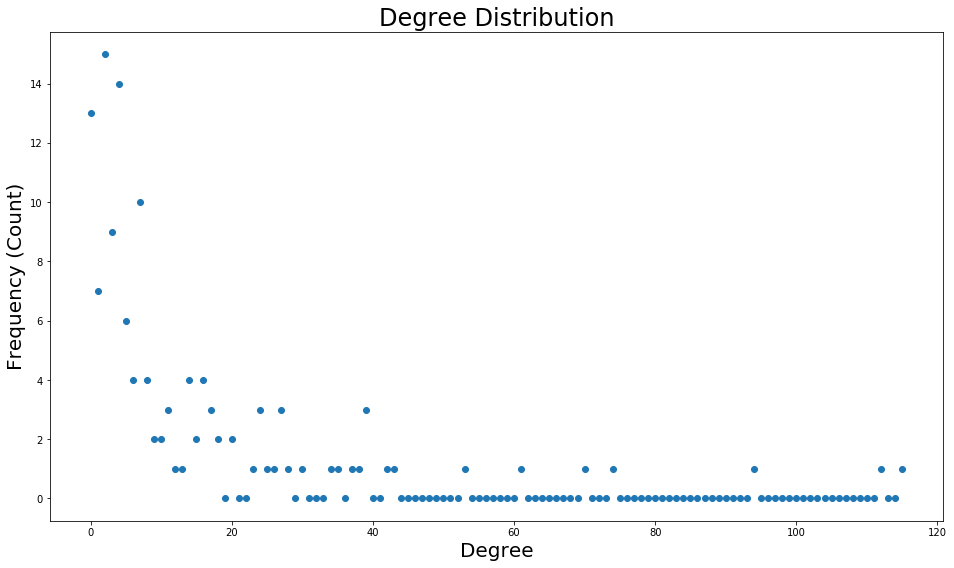

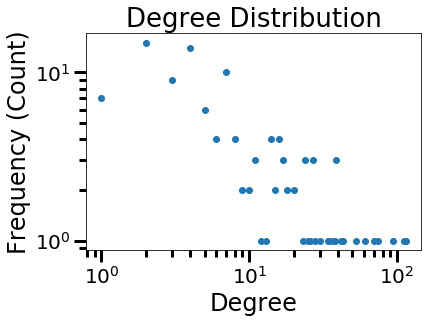

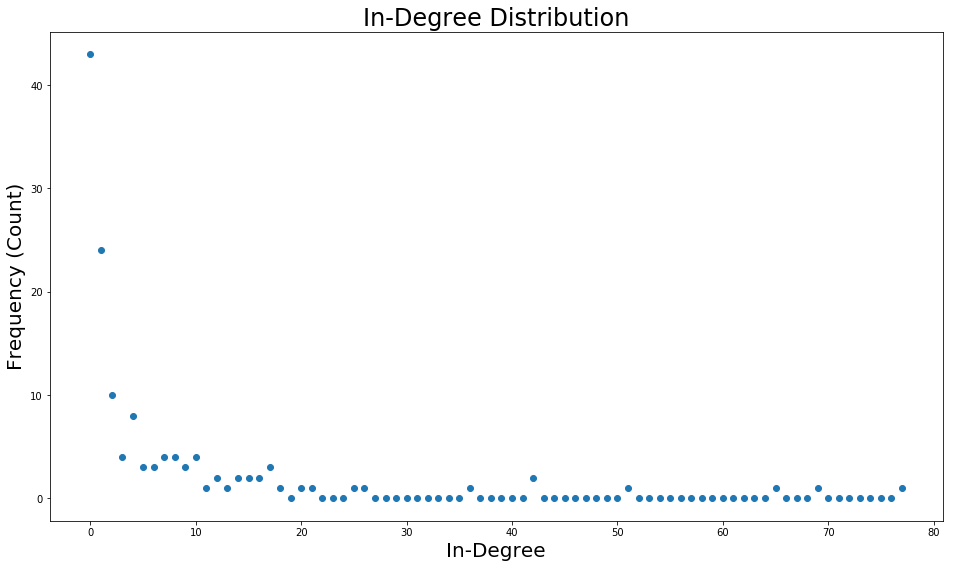

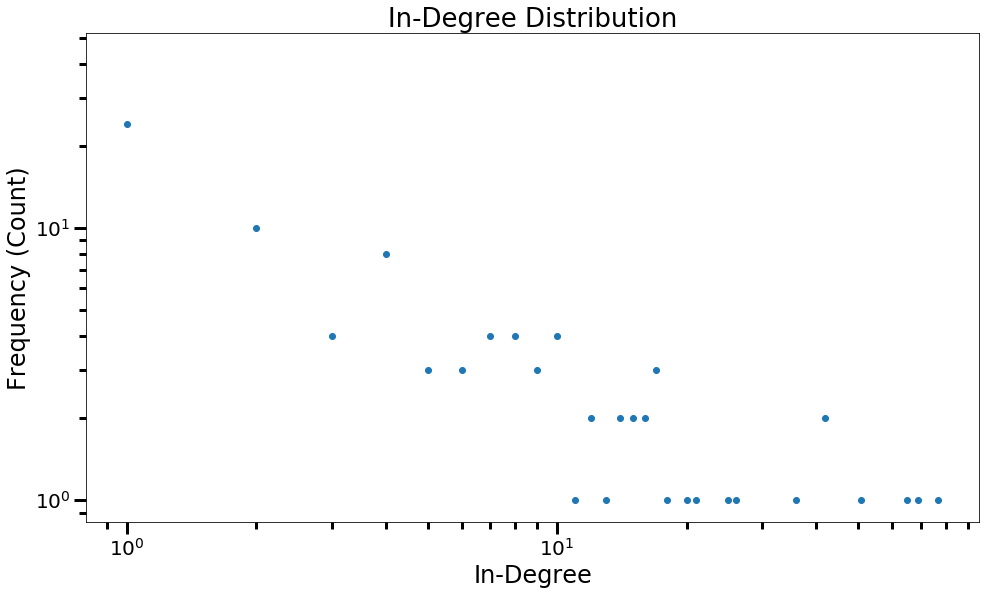

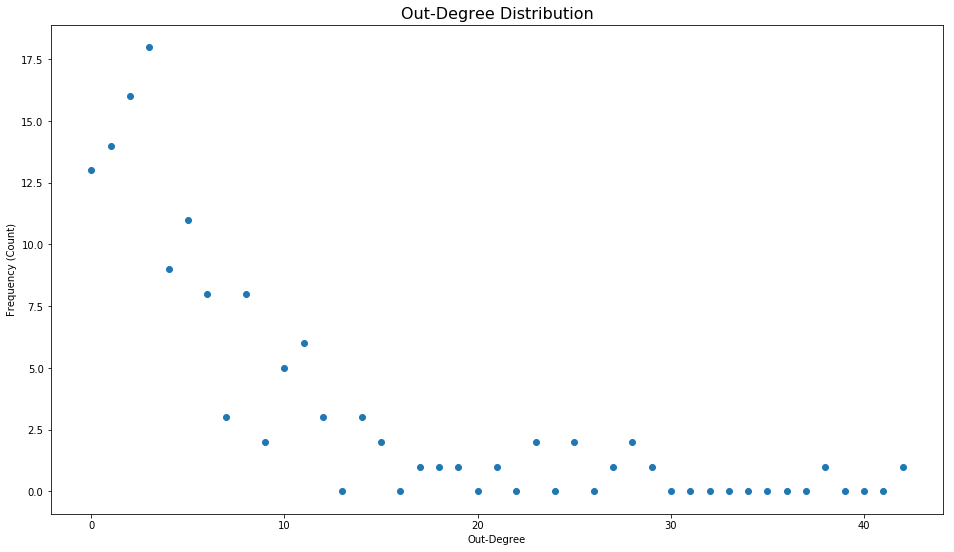

...

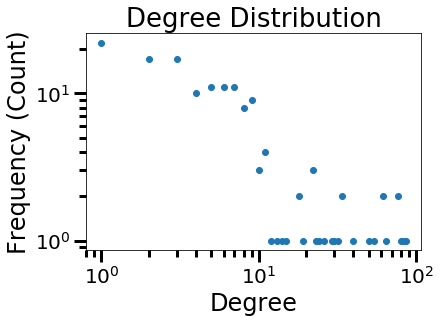

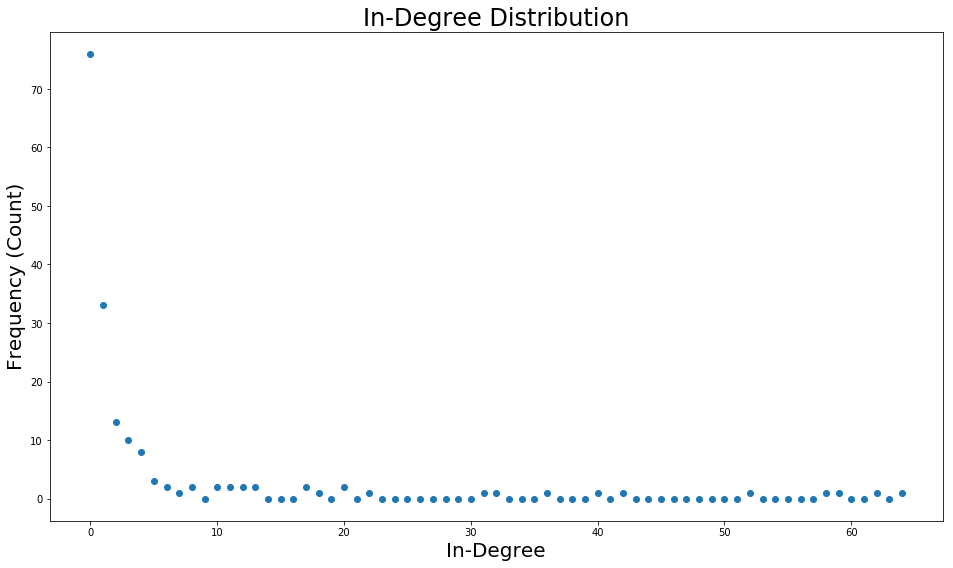

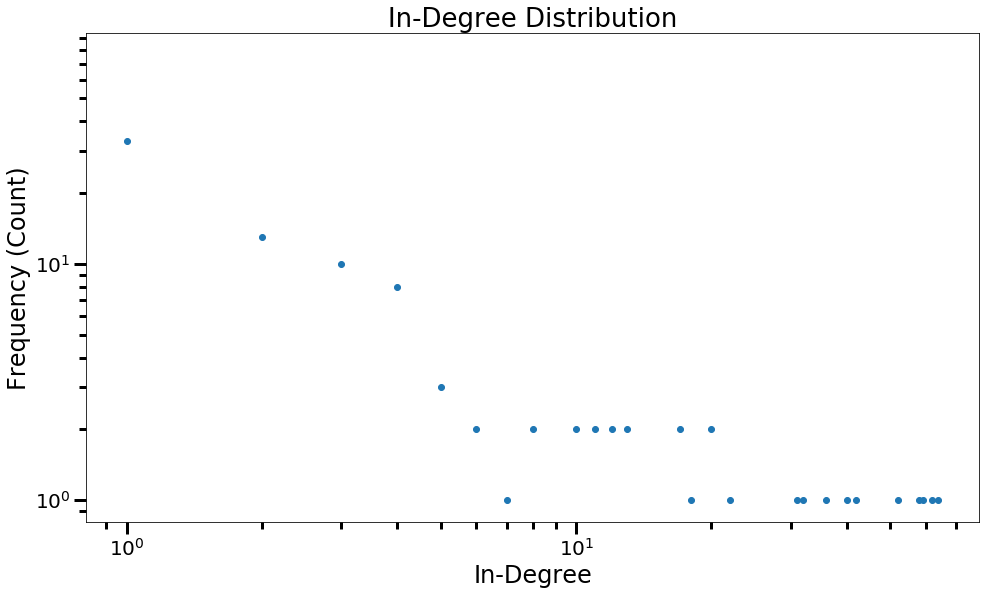

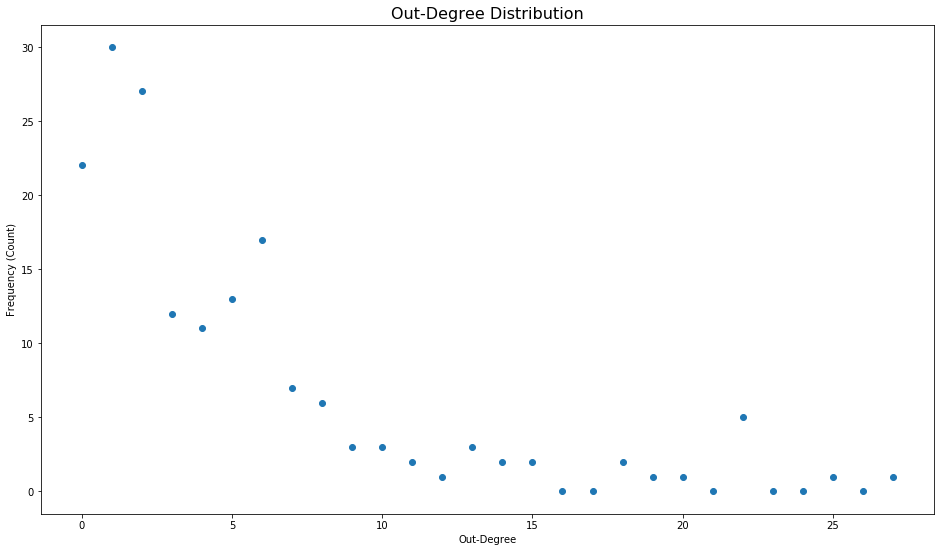

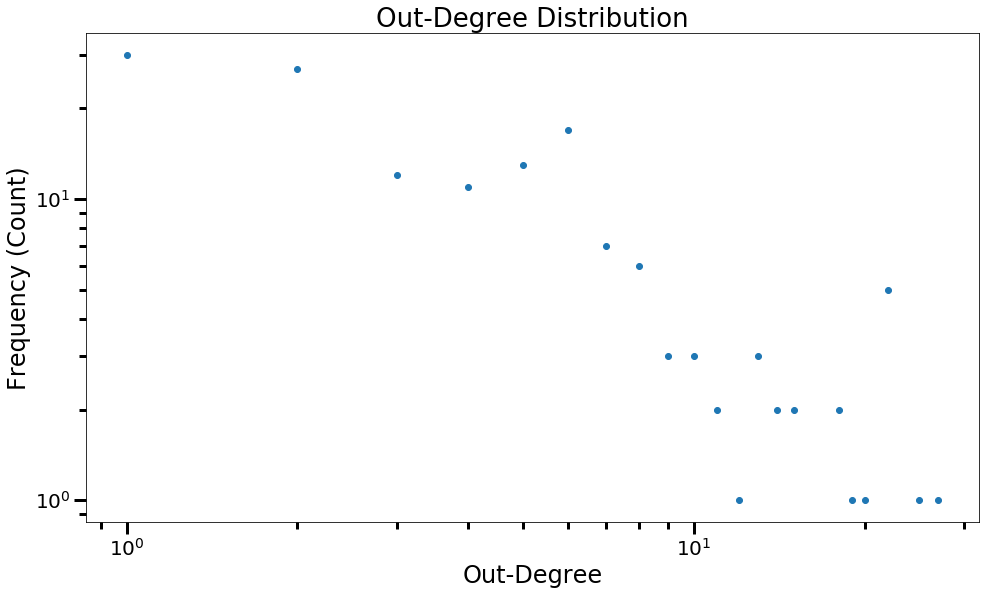

In [26]:
for d in digraphs.keys():
    print "\n\n\n"
    print d
    DG = digraphs[d]["graph"]
    nodes = DG.nodes(data=True)
    nodes_2, degrees = zip(*DG.degree())
    

    deg_cent = nx.degree_centrality(DG)
    degree_centrality = [deg_cent[n] for n in nodes_2]

    eig_cent = nx.eigenvector_centrality(DG)
    eigenvector_centrality = [eig_cent[n] for n in nodes_2]
    
    bet_cent = nx.betweenness_centrality(DG)
    betweenness_centrality = [bet_cent[n] for n in nodes_2]
    
    in_deg = DG.in_degree()
    out_deg = DG.out_degree()
    in_degree = [in_deg[n] for n in nodes_2]
    out_degree = [out_deg[n] for n in nodes_2]
    
    df = pd.DataFrame(data=dict(name=nodes_2, degree=degrees, 
                                degree_centrality=degree_centrality,
                               eigenvector_centrality=eigenvector_centrality,
                               betweenness_centrality=betweenness_centrality,
                               in_degree=in_degree,
                               out_degree=out_degree))
    
    directory = os.path.join("Data", d.replace(" ", "_").replace(":",""))
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    writer = pd.ExcelWriter(os.path.join(directory, "centrality.xlsx"), engine='xlsxwriter')
    df.to_excel(writer, sheet_name='Sheet1')
    
    from IPython.display import display, HTML

    df = df.sort_values(by="degree", ascending=False)
    print "10 highest degree"
    display(df[["name", "degree"]][:10].to_html(index=False))
    with open(os.path.join(directory, "top10_degree.txt"), 'w') as f:
        f.write(df[["name", "degree"]][:10].to_html(index=False).encode('utf-8'))
    
    df = df.sort_values(by="in_degree", ascending=False)
    print "10 highest in-degree"
    display(HTML(df[["name", "in_degree"]][:10].to_html(index=False)))
    with open(os.path.join(directory, "top10_in_degree.txt"), 'w') as f:
        f.write(df[["name", "in_degree"]][:10].to_html(index=False).encode('utf-8'))
    
    df = df.sort_values(by="out_degree", ascending=False)
    print "10 highest out-degree"
    display(HTML(df[["name", "out_degree"]][:10].to_html(index=False)))
    with open(os.path.join(directory, "top10_out_degree.txt"), 'w') as f:
        f.write(df[["name", "out_degree"]][:10].to_html(index=False).encode('utf-8'))

    df = df.sort_values(by="degree_centrality", ascending=False)
    print "10 highest degree centrality"
    display(HTML(df[["name", "degree_centrality"]][:10].to_html(index=False)))
    with open(os.path.join(directory, "top10_deg_cent.txt"), 'w') as f:
        f.write(df[["name", "degree_centrality"]][:10].to_html(index=False).encode('utf-8'))

    df = df.sort_values(by="eigenvector_centrality", ascending=False)
    print "10 highest eigenvector centrality"
    display(HTML(df[["name", "eigenvector_centrality"]][:10].to_html(index=False)))
    with open(os.path.join(directory, "top10_eig_cent.txt"), 'w') as f:
        f.write(df[["name", "eigenvector_centrality"]][:10].to_html(index=False).encode('utf-8'))
    
    df = df.sort_values(by="betweenness_centrality", ascending=False)
    print "10 highest betweenness_centrality"
    display(HTML(df[["name", "betweenness_centrality"]][:10].to_html(index=False)))
    with open(os.path.join(directory, "top10_betw_cent.txt"), 'w') as f:
        f.write(df[["name", "betweenness_centrality"]][:10].to_html(index=False).encode('utf-8'))
    
    degree = zip(*DG.degree())[1]
    in_degree = zip(*DG.in_degree())[1]
    out_degree = zip(*DG.out_degree())[1]


    bins = np.arange(min(degree), max(degree)+1)
    hist, bins = np.histogram(degree, bins=bins)

    plt.figure(figsize=(16,9))
    plt.scatter(bins[:-1], hist)
    plt.xlabel("Degree", fontsize=20)
    plt.ylabel("Frequency (Count)", fontsize=20)
    plt.title("Degree Distribution", fontsize=24)


    plt.figure()
    plt.loglog(bins[:-1], hist, 'o')
    plt.xlabel("Degree", fontsize=24)
    plt.ylabel("Frequency (Count)", fontsize=24)
    plt.title("Degree Distribution", fontsize=26)
    plt.tick_params(labelsize=20, length=12, width=3, which="major")
    plt.tick_params(length=7, width=3, which="minor")
    plt.savefig(os.path.join(directory, "degree_distribution.png"))


    in_bins = np.arange(min(in_degree), max(in_degree)+1)
    in_hist, in_bins = np.histogram(in_degree, bins=in_bins)

    plt.figure(figsize=(16,9))
    plt.scatter(in_bins[:-1], in_hist)
    plt.xlabel("In-Degree", fontsize=20)
    plt.ylabel("Frequency (Count)", fontsize=20)
    plt.title("In-Degree Distribution", fontsize=24)

    plt.figure(figsize=(16,9))
    plt.loglog(in_bins[:-1], in_hist, 'o')
    plt.xlabel("In-Degree", fontsize=24)
    plt.ylabel("Frequency (Count)", fontsize=24)
    plt.title("In-Degree Distribution", fontsize=26)
    plt.tick_params(labelsize=20, length=12, width=3, which="major")
    plt.tick_params(length=7, width=3, which="minor")
    plt.savefig(os.path.join(directory, "in_degree_distribution.png"))


    out_bins = np.arange(min(out_degree), max(out_degree)+1)
    out_hist, out_bins = np.histogram(out_degree, bins=out_bins)

    plt.figure(figsize=(16,9))
    plt.scatter(out_bins[:-1], out_hist)
    plt.xlabel("Out-Degree")
    plt.ylabel("Frequency (Count)")
    plt.title("Out-Degree Distribution", fontsize=16)

    plt.figure(figsize=(16,9))
    plt.loglog(out_bins[:-1], out_hist, 'o')
    plt.xlabel("Out-Degree", fontsize=24)
    plt.ylabel("Frequency (Count)", fontsize=24)
    plt.title("Out-Degree Distribution", fontsize=26)
    plt.tick_params(labelsize=20, length=12, width=3, which="major")
    plt.tick_params(length=7, width=3, which="minor")
    plt.savefig(os.path.join(directory, "out_degree_distribution.png"))

    degree_dist_json = {"data": {"In_Degree": {"bins": [float(x) for x in bins[:-1]], "hist": [float(x) for x in hist]},
                                 "Out_Degree": {"bins": [float(x) for x in out_bins[:-1]], "hist": [float(x) for x in out_hist]},
                                 "Degree": {"bins": [float(x) for x in in_bins[:-1]], "hist": [float(x) for x in in_hist]}}}

    with open(os.path.join(directory, "degree_distribution.json"), 'w') as f:
        json.dump(degree_dist_json, f)

# Character sentiment

In [24]:
# ADD SENTIMENT TO THE JSON
dataframes = []
char_sentiment = defaultdict(dict)
chars = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
for i in range(len(chars)):
    c = chars[i]
    text = starwars_json["data"]["characters"][c]["wikicontent"]
    tokens = []

    # Only detect words and abbreviations, not numbers or punctuations
    pattern = r'''(?x)    # set flag to allow verbose regexps
        (?:[A-Z]\.)+        # abbreviations, e.g. U.S.A.
      | [A-Za-z]\w*(?:-\w+)*  # words with optional internal hyphens
      '''
    stopw = stopwords.words('english')
    other_words = []
    # Tokenize the text with regex
    tokens = nltk.regexp_tokenize(text, pattern)
    # Exclude twitter handles and stopwords from the list of tokens and set the token to lowercase
    tokens = [t.lower() for t in tokens if ((t.lower() not in stopw) and (t.lower() not in other_words))]

    df_tokens = pd.DataFrame(data=dict(word=tokens))
    dataframes.append(df_tokens)
    char_sentiment[c]["tokens"] = df_tokens
    char_sentiment[c]["sentiment"] = evaluate_sentiment(tokens)

tfidf_dataframes = TFIDF(dataframes)
for i in range(len(chars)):
    c = chars[i]
    char_sentiment[c]["TFIDF"] = tfidf_dataframes[i]

In [42]:
DG = digraphs["all"]["graph"]
nodes = DG.nodes(data=True)
nodes_2, degrees = zip(*DG.degree())

deg_cent = nx.degree_centrality(DG)
degree_centrality = [deg_cent[n] for n in nodes_2]

eig_cent = nx.eigenvector_centrality(DG)
eigenvector_centrality = [eig_cent[n] for n in nodes_2]

df = pd.DataFrame(data=dict(name=nodes_2, degree=degrees, 
                            degree_centrality=degree_centrality,
                           eigenvector_centrality=eigenvector_centrality))

df = df.sort_values(by="eigenvector_centrality", ascending=False)
sentiment_list = []
for n in df["name"].values:
    sentiment_list.append(char_sentiment[n]["sentiment"])
df["sentiment"] = sentiment_list

print df[["name", "sentiment"]][:40].sort_values(by="sentiment", ascending=False)

                       name  sentiment
1869            Jan Dodonna   3.622263
1807             Mon Mothma   3.568786
368                Han Solo   3.568666
709          Luke Skywalker   3.451366
612             Leia Organa   3.399977
1093       Lando Calrissian   3.399608
1834            Bail Organa   3.338552
1129              Chewbacca   3.331849
1443         Wilhuff Tarkin   3.323927
1760          Darth Sidious   3.307231
521            Qui-Gon Jinn   3.299560
526   Jabba Desilijic Tiure   3.288800
995           Jar Jar Binks   3.278801
820        Alexsandr Kallus   3.277009
1200      Mitth'raw'nuruodo   3.257984
1353            Saw Gerrera   3.241257
1566          Hera Syndulla   3.210893
28            Padmé Amidala   3.203028
30                    C-3PO   3.190684
752        Anakin Skywalker   3.165466
685             Darth Vader   3.165466
1458           Ezra Bridger   3.153452
1850            Sabine Wren   3.150525
246               Boba Fett   3.149045
669                    Yo

In [65]:
affiliation_sentiment = defaultdict(list)
for n in df.name.values:
    for a in starwars_json["data"]["characters"][n]["affiliations"]:
        affiliation_sentiment[a].append(char_sentiment[n]["sentiment"])

all_affiliations = affiliation_sentiment.keys()
sentiment_list = []
member_number = []
for a in all_affiliations:
    member_number.append(len(affiliation_sentiment[a]))
    sentiment_list.append(np.mean(affiliation_sentiment[a]))
    
df_aff = pd.DataFrame(data=dict(affiliation=all_affiliations, sentiment=sentiment_list, members=member_number))
df_aff = df_aff[df_aff["members"] > 4]
print df_aff.sort_values(by="sentiment", ascending=False)

                                 affiliation  members  sentiment
20                               White Worms       14   3.856994
190        Corellian Engineering Corporation        5   3.825041
56                              Crimson Dawn       17   3.628346
211                        Force Priestesses        5   3.589443
78                           Naberrie family        5   3.571838
145          Figrin D'an and the Modal Nodes        8   3.541271
49                               First Order       48   3.518279
28          Alliance to Restore the Republic      219   3.491772
131                             Canto Casino        7   3.482502
14                         Bright Tree tribe       18   3.471881
108                             New Republic       35   3.442658
24                InterGalactic Banking Clan        5   3.433022
185                               Resistance       92   3.418026
40                           House of Organa       10   3.417626
199                      

# Communities

In [98]:
DG = digraphs["all"]["graph"]
nodes = DG.nodes(data=True)
new_aff = defaultdict(dict)
for n in nodes:
    a = n[1]["data"]["affiliations"]
    new_aff[c]["affil"] = a
    
nx.set_node_attributes(DG, new_aff)    

affiliations_count = defaultdict(int)
all_affiliations = []
nodes = DG.nodes(data=True)
# print nodes
for n in nodes:
    all_affiliations.append(n[1]["affil"])
    affiliations_count[n[1]["affil"]] += 1
    
all_affiliations = list(set(all_affiliations))


affiliation_df = pd.DataFrame(data={"group": all_affiliations, "count": [affiliations_count[c] for c in all_affiliations]})
print len(affiliation_df)
affiliation_df = affiliation_df[(affiliation_df["count"]>0)].sort_values(by="count", ascending=False)[["group", "count"]]
print len(affiliation_df)

207
207


In [99]:
G = DG.to_undirected()
# Calculate the modularity coefficient of the partition
M = 0.0
L = float(len(G.edges()))
nodes = DG.nodes(data=True)
for com in affiliation_df["group"].values :
    list_nodes = [n[0] for n in nodes
                                if n[1]["affil"] == com]
    Lc = 0.0
    kc = 0.0
    for i in range(len(list_nodes)-1):
        character = list_nodes[i]
        kc += G.degree(character)
        for neighbor in G.neighbors(character):
            if neighbor in list_nodes[i+1:]:
                Lc += 1.0
    M += ((Lc/L) - np.power((kc/(2*L)), 2))
    
print("The modularity of the optimal community partition is: M={0}".format(M))

The modularity of the optimal community partition is: M=0.15285581721


In [123]:
# Find the best community partition

G = DG.to_undirected()
partition = community.best_partition(G)
print len(set(partition.values()))
# Calculate the modularity coefficient of the partition
M = 0.0
L = float(len(G.edges()))

com_size = defaultdict(int)

for com in set(partition.values()) :
    list_nodes = [nodes for nodes in partition.keys()
                                if partition[nodes] == com]
    Lc = 0.0
    kc = 0.0
    for i in range(len(list_nodes)-1):
        character = list_nodes[i]
        kc += G.degree(character)
        for neighbor in G.neighbors(character):
            if neighbor in list_nodes[i+1:]:
                Lc += 1.0
    M += ((Lc/L) - np.power((kc/(2*L)), 2))
    
print("The modularity of the optimal community partition is: M={0}".format(M))

for com in partition.values():
    com_size[com] += 1

df_community_size = pd.DataFrame(data={"com":com_size.keys(), "count":[com_size[x] for x in com_size.keys()]})

df_community_size = df_community_size[["com", "count"]].sort_values(by="count", ascending=False)

257
The modularity of the optimal community partition is: M=0.516569257311
     com  count
6      6    383
0      0    382
3      3    220
9      9    220
10    10    165
5      5    119
7      7     71
23    23     47
2      2     28
12    12     22
18    18     19
105  105      4
83    83      3
84    84      3
66    66      3
20    20      3
80    80      3
148  148      2
1      1      2
192  192      2
67    67      2
207  207      2
13    13      2
37    37      2
123  123      2
48    48      2
21    21      2
152  152      1
175  175      1
177  177      1
..   ...    ...
110  110      1
108  108      1
77    77      1
107  107      1
78    78      1
79    79      1
81    81      1
82    82      1
85    85      1
86    86      1
87    87      1
88    88      1
89    89      1
90    90      1
91    91      1
92    92      1
93    93      1
94    94      1
95    95      1
96    96      1
97    97      1
98    98      1
99    99      1
100  100      1
101  101      1
102  102     

['graph']


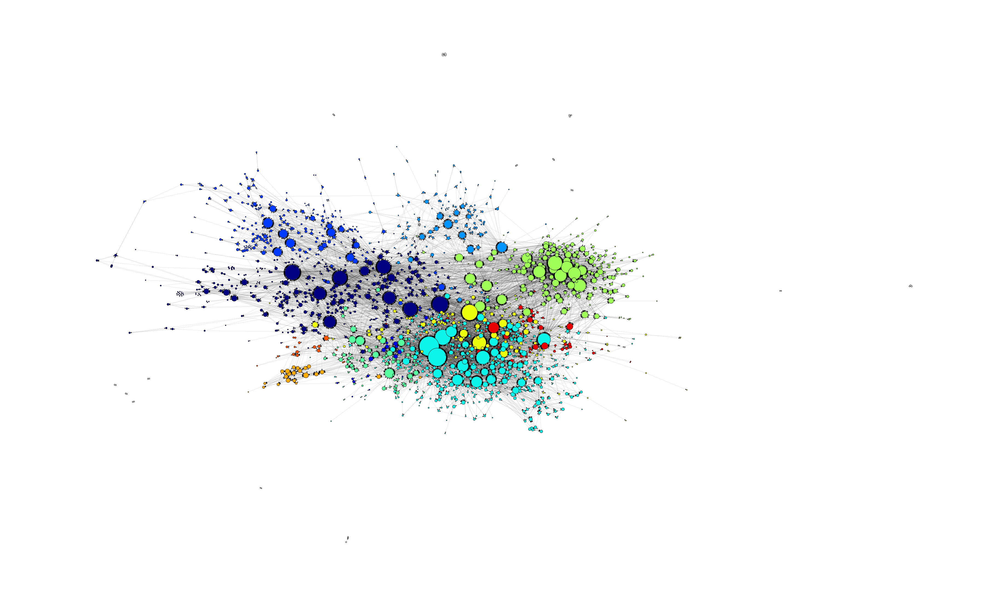

In [133]:
# Read the json file that contains data for graph regeneration
with open(os.path.join("Data", "movie_networks.json"), 'r') as f:
    starwars_networks = json.load(f)


nodes = DG.nodes(data=True)
nodes_2, degrees = zip(*DG.degree())

# node size proportional to the degree
node_sizes_deg = [10*x for x in degrees]

# # Color according to the party
node_colors = [partition[n] for n in nodes_2]
# print node_colors
cmap = plt.get_cmap("jet")
max_partition = float(max(node_colors))
biggest_coms = list(df_community_size[df_community_size["count"]>9]["com"].values)
node_colors = [cmap(biggest_coms.index(col)/float(len(biggest_coms))) if col in biggest_coms else (1.0, 1.0, 1.0, 1.0) for col in node_colors]
# print node_colors
# nx.draw(DG, positions, node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)

plt.figure(figsize=(50,30))
print digraphs["all"].keys()
nx.draw(DG, starwars_networks["all"]["node_pos"], node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="k", edge_color='k', width=0.1)
#     plt.title(dig)




directory = os.path.join("Data", "all")
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(os.path.join(directory, "network_optimal_partitions.png"))

['graph']


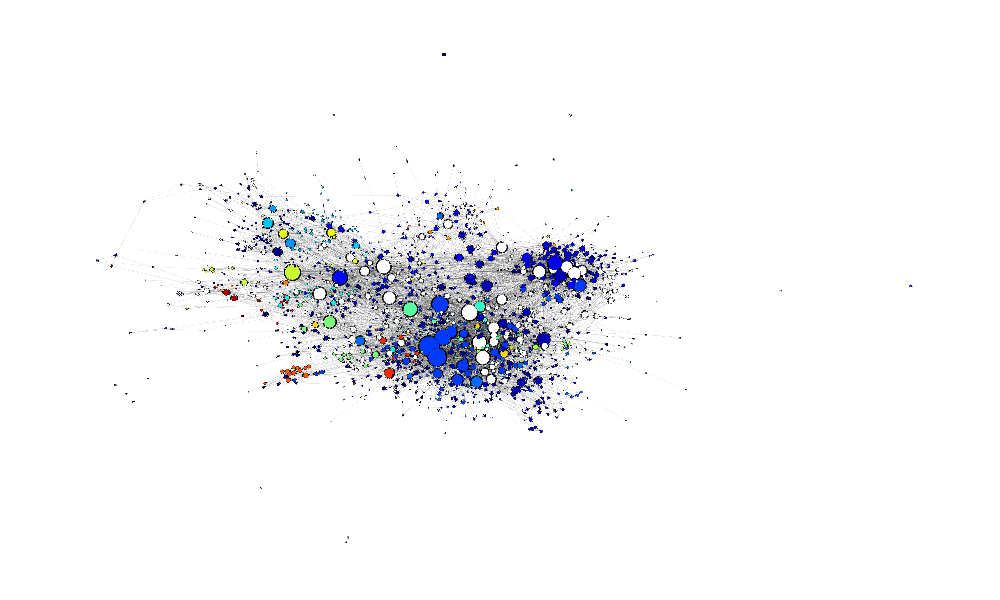

In [134]:
nodes = DG.nodes(data=True)
nodes_2, degrees = zip(*DG.degree())

# node size proportional to the degree
node_sizes_deg = [10*x for x in degrees]

# # Color according to the party
possible_affiliations = affiliation_df[(affiliation_df["count"]>9)]
temp = dict(DG.nodes(data=True))

node_colors = [temp[n]["affil"] for n in nodes_2]
# print node_colors
cmap = plt.get_cmap("jet")
biggest_coms = list(possible_affiliations["group"].values)
node_colors = [cmap(biggest_coms.index(col)/float(len(biggest_coms))) if col in biggest_coms else (1.0, 1.0, 1.0, 1.0) for col in node_colors]
# print node_colors
# nx.draw(DG, positions, node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)

plt.figure(figsize=(50,30))
print digraphs["all"].keys()
nx.draw(DG, starwars_networks["all"]["node_pos"], node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="k", edge_color='k', width=0.1)
#     plt.title(dig)

directory = os.path.join("Data", "all")
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(os.path.join(directory, "network_affiliation_partitions.png"))